In [1]:
# ---------------------------------------- File 2_LAC_SN_geo ---------------------------------------- #
# This is the second step of creating the NSMI for the Netherlands. 
# This script deals the datasets of Statistics Netherlands containing the neighborhood geometry and socio-demographics
# This script performs the data loading, cleaning and descriptive statistics analysis. 

# Importing the libraries for this script
from IPython.display import display
import geopandas as gpd
import matplotlib.patches as mpatches
import matplotlib.pyplot as plt
from IPython.display import display
import pandas as pd
import numpy as np
from ydata_profiling import ProfileReport

In [2]:
# ---------------------------------------------- PART 1 ---------------------------------------------- #	
# This first part of the script will locate the geometry files of the Statistics Nethelands datasets and will perform the data cleaning and preparation.

In [3]:
# The geopackages can be downloaded from the following links.
# The user should download these geopackages before running this script.

# The links per year:
# 2018: https://www.nationaalgeoregister.nl/geonetwork/srv/dut/catalog.search#/metadata/ffefc3dc-dc8f-4589-ae22-a60bebcdf5cb 
# 2019: https://www.nationaalgeoregister.nl/geonetwork/srv/dut/catalog.search#/metadata/5c37d29a-006d-4136-8989-adfc35a1d4a7
# 2020: https://www.nationaalgeoregister.nl/geonetwork/srv/dut/catalog.search#/metadata/f1859b4d-93be-4fc8-9e91-0ecc2fa0f3b3
# 2021: https://www.nationaalgeoregister.nl/geonetwork/srv/dut/catalog.search#/metadata/524b1e94-1981-4ef6-be1f-482d309b5db8
# 2022: https://www.nationaalgeoregister.nl/geonetwork/srv/dut/catalog.search#/metadata/70c52fd8-6b2e-42aa-873a-742711903243

In [4]:
# This piece of code is used to read the data from the geopackage file and print the column names.

# Specify the path to the GeoPackage
# The user should change the path to the location of the geopackage file on their computer.
geopackage_neighborhoods_2018 = 'C:/Users/20182306/OneDrive - TU Eindhoven/Documents/Master - Jaar 1, 2 & 3/year 3/INPUT/Neighborhoods/neighborhoods_2018.gpkg'
geopackage_neighborhoods_2019 = 'C:/Users/20182306/OneDrive - TU Eindhoven/Documents/Master - Jaar 1, 2 & 3/year 3/INPUT/Neighborhoods/neighborhoods_2019.gpkg'
geopackage_neighborhoods_2020 = 'C:/Users/20182306/OneDrive - TU Eindhoven/Documents/Master - Jaar 1, 2 & 3/year 3/INPUT/Neighborhoods/neighborhoods_2020.gpkg'
geopackage_neighborhoods_2021 = 'C:/Users/20182306/OneDrive - TU Eindhoven/Documents/Master - Jaar 1, 2 & 3/year 3/INPUT/Neighborhoods/neighborhoods_2021.gpkg'
geopackage_neighborhoods_2022 = 'C:/Users/20182306/OneDrive - TU Eindhoven/Documents/Master - Jaar 1, 2 & 3/year 3/INPUT/Neighborhoods/neighborhoods_2022.gpkg'

# Load the GeoPackage
geo_2018 = gpd.read_file(geopackage_neighborhoods_2018)
geo_2019 = gpd.read_file(geopackage_neighborhoods_2019)
geo_2020 = gpd.read_file(geopackage_neighborhoods_2020)
geo_2021 = gpd.read_file(geopackage_neighborhoods_2021)
geo_2022 = gpd.read_file(geopackage_neighborhoods_2022)

# Get the column names of each GeoDataFrame as a list
columns_2018 = geo_2018.columns.tolist()
columns_2019 = geo_2019.columns.tolist()
columns_2020 = geo_2020.columns.tolist()
columns_2021 = geo_2021.columns.tolist()
columns_2022 = geo_2022.columns.tolist()

# Display the DataFrame
print(columns_2018)
print(columns_2019)
print(columns_2020)
print(columns_2021)
print(columns_2022)

# The output shows that the column names are not kept the same throughout the years. Adaptations are needed to make the datasets compatible.

['buurtcode', 'buurtnaam', 'wijkcode', 'gemeentecode', 'gemeentenaam', 'indelingswijzigingWijkenEnBuurten', 'water', 'meestVoorkomendePostcode', 'dekkingspercentage', 'omgevingsadressendichtheid', 'stedelijkheidAdressenPerKm2', 'bevolkingsdichtheidInwonersPerKm2', 'aantalInwoners', 'mannen', 'vrouwen', 'percentagePersonen0Tot15Jaar', 'percentagePersonen15Tot25Jaar', 'percentagePersonen25Tot45Jaar', 'percentagePersonen45Tot65Jaar', 'percentagePersonen65JaarEnOuder', 'percentageOngehuwd', 'percentageGehuwd', 'percentageGescheid', 'percentageVerweduwd', 'geboorteTotaal', 'geboortesPer1000Inwoners', 'sterfteTotaal', 'sterfteRelatief', 'aantalHuishoudens', 'percentageEenpersoonshuishoudens', 'percentageHuishoudensZonderKinderen', 'percentageHuishoudensMetKinderen', 'gemiddeldeHuishoudsgrootte', 'percentageWesterseMigratieachtergrond', 'percentageNietWesterseMigratieachtergrond', 'percentageUitMarokko', 'percentageUitNederlandseAntillenEnAruba', 'percentageUitSuriname', 'percentageUitTurkije

In [5]:
# The next step is to check the number of rows in each dataset. This shows how many changes in neighborhoods there are between the years. 
print("Number of rows in gdf_2018_MC_1:", len(geo_2018))
print("Number of rows in gdf_2019_MC_1:", len(geo_2019))
print("Number of rows in gdf_2020_MC_1:", len(geo_2020))
print("Number of rows in gdf_2021_MC_1:", len(geo_2021))
print("Number of rows in gdf_2022_MC_1:", len(geo_2022))

# Every year the number of neighborhoods enlarges by about 200. 
# This is due to changing neighborhood geometries, neighborhoods that are transfered between municipalities, neighborhoods that obtain new names, and the addidtion of new neighborhoods by splitting old neighborhoods into multiple smaller ones.

Number of rows in gdf_2018_MC_1: 13404
Number of rows in gdf_2019_MC_1: 13689
Number of rows in gdf_2020_MC_1: 13903
Number of rows in gdf_2021_MC_1: 14175
Number of rows in gdf_2022_MC_1: 14412


In [6]:
# As can be seen in the previous two outputs. The columns in the geopackages largely contain the same information, however, the column names are not the same.
# Therefore, the column names are renamed to the same names in this piece of code.

# Define a function to clean the column names
# This function replaces spaces or underscores with nothing and converts all characters to lowercase.
def clean_column_names(df):
    df.columns = df.columns.str.lower().str.replace(' ', '').str.replace('_', '')
    return df

# Apply the function to each GeoDataFrame, ECN stands for equal column names.
geo_2018_ECN = clean_column_names(geo_2018)
geo_2019_ECN = clean_column_names(geo_2019)
geo_2020_ECN = clean_column_names(geo_2020)
geo_2021_ECN = clean_column_names(geo_2021)
geo_2022_ECN = clean_column_names(geo_2022)

# To show the results, the column names are printed again.
# Get the column names of each GeoDataFrame as a list
columns_2018_ECN = geo_2018_ECN.columns.tolist()
columns_2019_ECN = geo_2019_ECN.columns.tolist()
columns_2020_ECN = geo_2020_ECN.columns.tolist()
columns_2021_ECN = geo_2021_ECN.columns.tolist()
columns_2022_ECN = geo_2022_ECN.columns.tolist()

# Display the DataFrame
print(columns_2018_ECN)
print(columns_2019_ECN)
print(columns_2020_ECN)
print(columns_2021_ECN)
print(columns_2022_ECN)

['buurtcode', 'buurtnaam', 'wijkcode', 'gemeentecode', 'gemeentenaam', 'indelingswijzigingwijkenenbuurten', 'water', 'meestvoorkomendepostcode', 'dekkingspercentage', 'omgevingsadressendichtheid', 'stedelijkheidadressenperkm2', 'bevolkingsdichtheidinwonersperkm2', 'aantalinwoners', 'mannen', 'vrouwen', 'percentagepersonen0tot15jaar', 'percentagepersonen15tot25jaar', 'percentagepersonen25tot45jaar', 'percentagepersonen45tot65jaar', 'percentagepersonen65jaarenouder', 'percentageongehuwd', 'percentagegehuwd', 'percentagegescheid', 'percentageverweduwd', 'geboortetotaal', 'geboortesper1000inwoners', 'sterftetotaal', 'sterfterelatief', 'aantalhuishoudens', 'percentageeenpersoonshuishoudens', 'percentagehuishoudenszonderkinderen', 'percentagehuishoudensmetkinderen', 'gemiddeldehuishoudsgrootte', 'percentagewestersemigratieachtergrond', 'percentagenietwestersemigratieachtergrond', 'percentageuitmarokko', 'percentageuitnederlandseantillenenaruba', 'percentageuitsuriname', 'percentageuitturkije

In [7]:
# Find the common columns across all GeoDataFrames
common_columns = set(geo_2022_ECN.columns)
common_columns.intersection_update(geo_2021_ECN.columns, geo_2020_ECN.columns, geo_2019_ECN.columns, geo_2018_ECN.columns)

# Convert the set to a list
common_columns_list = list(common_columns)

# Create new GeoDataFrames that only contain the common columns
# In this code, MC stands for "matching columns".
geo_2018_MC = geo_2018_ECN[common_columns_list]
geo_2019_MC = geo_2019_ECN[common_columns_list]
geo_2020_MC = geo_2020_ECN[common_columns_list]
geo_2021_MC = geo_2021_ECN[common_columns_list]
geo_2022_MC = geo_2022_ECN[common_columns_list]

# Reorder the columns of the new GeoDataFrames to match the order of the common columns in the original gdf_2018 GeoDataFrame
common_columns_2018 = [col for col in geo_2018.columns if col in common_columns]
geo_2018_MC_order = geo_2018_MC[common_columns_2018]
geo_2019_MC_order = geo_2019_MC[common_columns_2018]
geo_2020_MC_order = geo_2020_MC[common_columns_2018]
geo_2021_MC_order = geo_2021_MC[common_columns_2018]
geo_2022_MC_order = geo_2022_MC[common_columns_2018]

In [8]:
# To show the results, the column names are printed again.
# Get the column names of each GeoDataFrame as a list
columns_2018_ECN = geo_2018_MC_order.columns.tolist()
columns_2019_ECN = geo_2019_MC_order.columns.tolist()
columns_2020_ECN = geo_2020_MC_order.columns.tolist()
columns_2021_ECN = geo_2021_MC_order.columns.tolist()
columns_2022_ECN = geo_2022_MC_order.columns.tolist()

# Display the DataFrame
print(columns_2022_ECN)
print(columns_2021_ECN)
print(columns_2020_ECN)
print(columns_2019_ECN)
print(columns_2018_ECN)

# The results show that the column names are the same for all the geopackages.

['buurtcode', 'buurtnaam', 'wijkcode', 'gemeentecode', 'gemeentenaam', 'indelingswijzigingwijkenenbuurten', 'water', 'meestvoorkomendepostcode', 'dekkingspercentage', 'omgevingsadressendichtheid', 'stedelijkheidadressenperkm2', 'bevolkingsdichtheidinwonersperkm2', 'aantalinwoners', 'mannen', 'vrouwen', 'percentagepersonen0tot15jaar', 'percentagepersonen15tot25jaar', 'percentagepersonen25tot45jaar', 'percentagepersonen45tot65jaar', 'percentagepersonen65jaarenouder', 'percentageongehuwd', 'percentagegehuwd', 'percentagegescheid', 'percentageverweduwd', 'aantalhuishoudens', 'percentageeenpersoonshuishoudens', 'percentagehuishoudenszonderkinderen', 'percentagehuishoudensmetkinderen', 'gemiddeldehuishoudsgrootte', 'percentagewestersemigratieachtergrond', 'percentagenietwestersemigratieachtergrond', 'percentageuitmarokko', 'percentageuitnederlandseantillenenaruba', 'percentageuitsuriname', 'percentageuitturkije', 'percentageoverigenietwestersemigratieachtergrond', 'oppervlaktetotaalinha', 'o

In [9]:
# Save the new GeoDataFrames to GeoPackage files
geo_2018_MC_order.to_file("intermediate/gdf_2018_MC.gpkg", driver="GPKG")
geo_2019_MC_order.to_file("intermediate/gdf_2019_MC.gpkg", driver="GPKG")
geo_2020_MC_order.to_file("intermediate/gdf_2020_MC.gpkg", driver="GPKG")
geo_2021_MC_order.to_file("intermediate/gdf_2021_MC.gpkg", driver="GPKG")
geo_2022_MC_order.to_file("intermediate/gdf_2022_MC.gpkg", driver="GPKG")

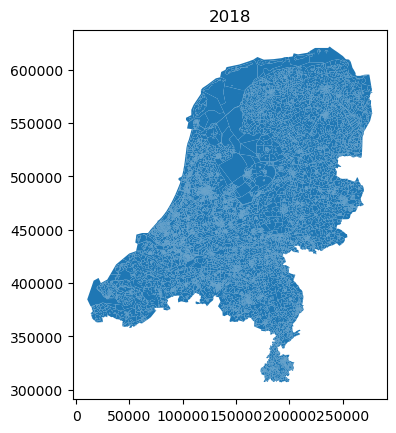

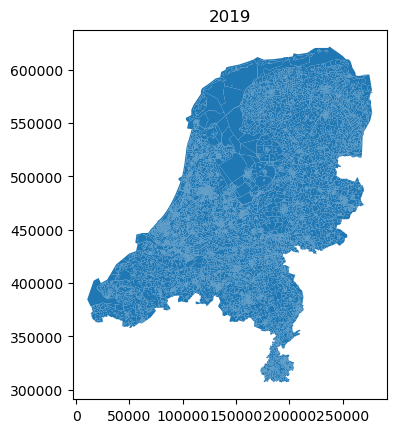

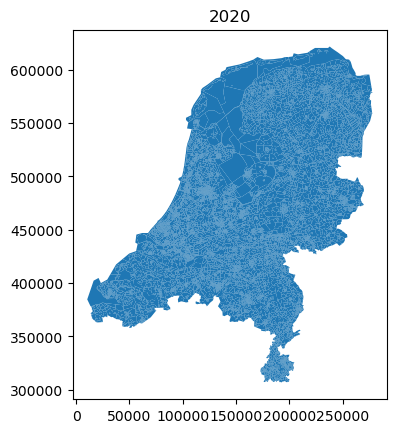

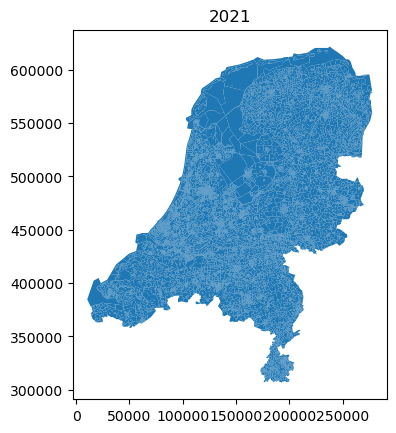

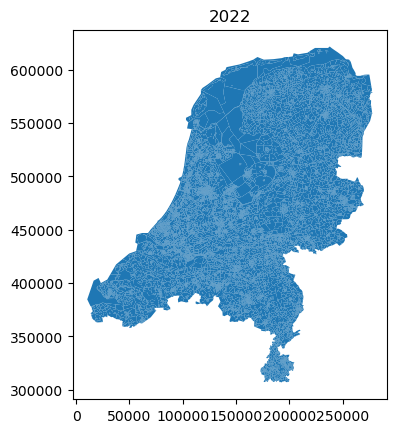

In [10]:
# Now that the columns are cleaned, the geometry of the neighborhoods needs to be checked.
# This piece of code is used to plot the geometry of the neighborhoods for every year from 2018 to 2022.
# Here, it can be seen that the multipolygons are plotted in the Netherlands, using the reference system RD New (EPSG:28992).

# Plot the multipolygons with titles
geo_2018_MC_order.plot().set_title('2018')
geo_2019_MC_order.plot().set_title('2019')
geo_2020_MC_order.plot().set_title('2020')
geo_2021_MC_order.plot().set_title('2021')
geo_2022_MC_order.plot().set_title('2022')  

# Show the plots
plt.show()

# The map shows that the neighborhoods also contain water areas. This is not needed since complete neighborhoods designated as water are not part of the NSMI.

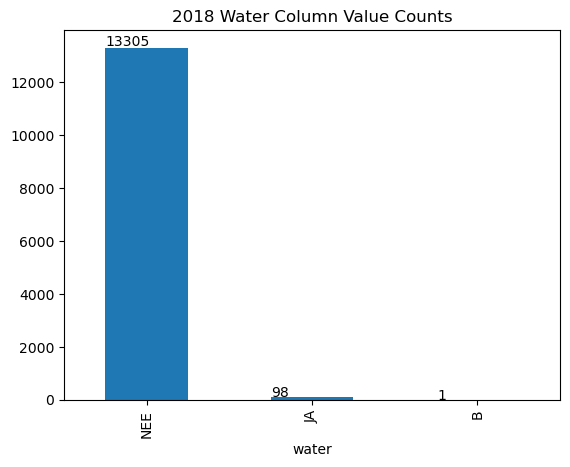

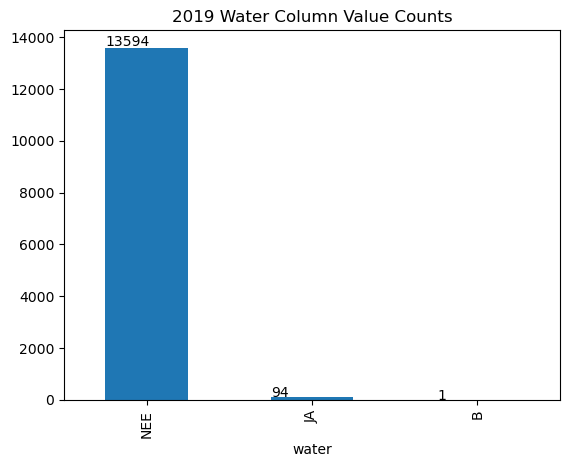

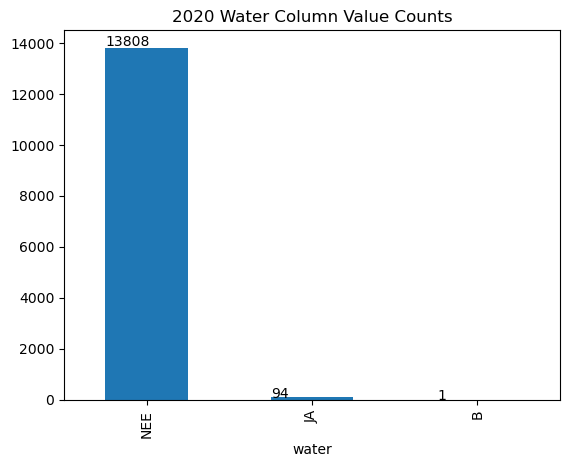

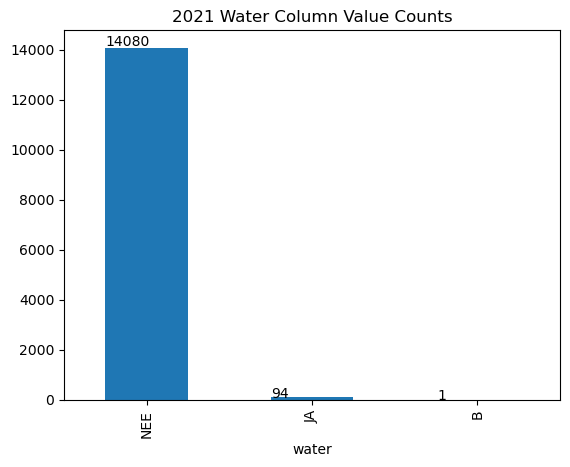

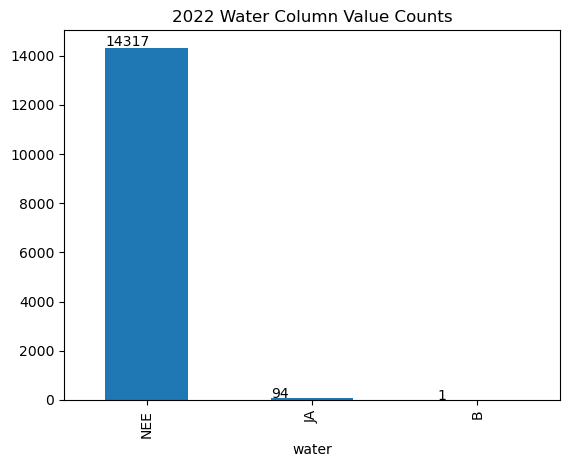

In [11]:
# To show the value typologies in the column "water" for each year, the following piece of code is used.
# This piece of code creates a function which is used to plot a bar chart based on the dataframe (df), the column name (column), and the title of the plot (title).
def plot_value_counts(df, column, title):
    ax = df[column].value_counts().plot(kind='bar')
    ax.set_title(title)
    for p in ax.patches:
        ax.annotate(str(p.get_height()), (p.get_x() * 1.005, p.get_height() * 1.005))
    plt.show()

# Here, the function that was defined above can be used to create bar plots for each dataframe. 
plot_value_counts(geo_2018_MC_order, 'water', '2018 Water Column Value Counts')
plot_value_counts(geo_2019_MC_order, 'water', '2019 Water Column Value Counts')
plot_value_counts(geo_2020_MC_order, 'water', '2020 Water Column Value Counts')
plot_value_counts(geo_2021_MC_order, 'water', '2021 Water Column Value Counts')
plot_value_counts(geo_2022_MC_order, 'water', '2022 Water Column Value Counts')

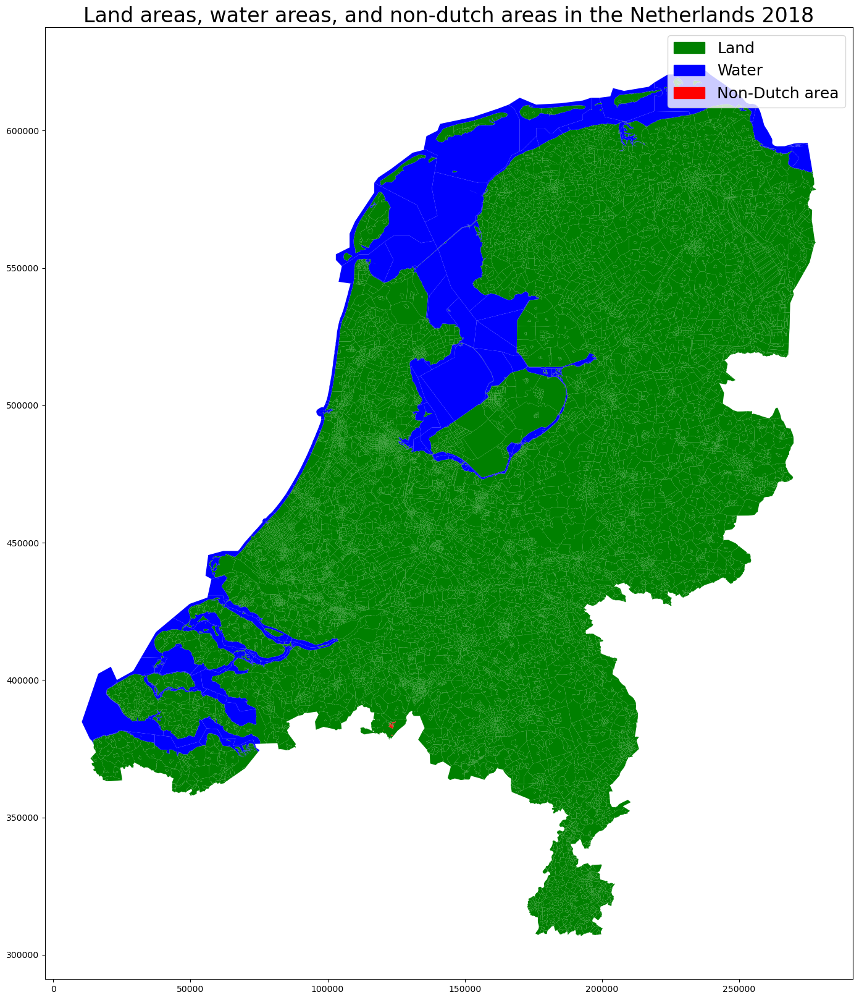

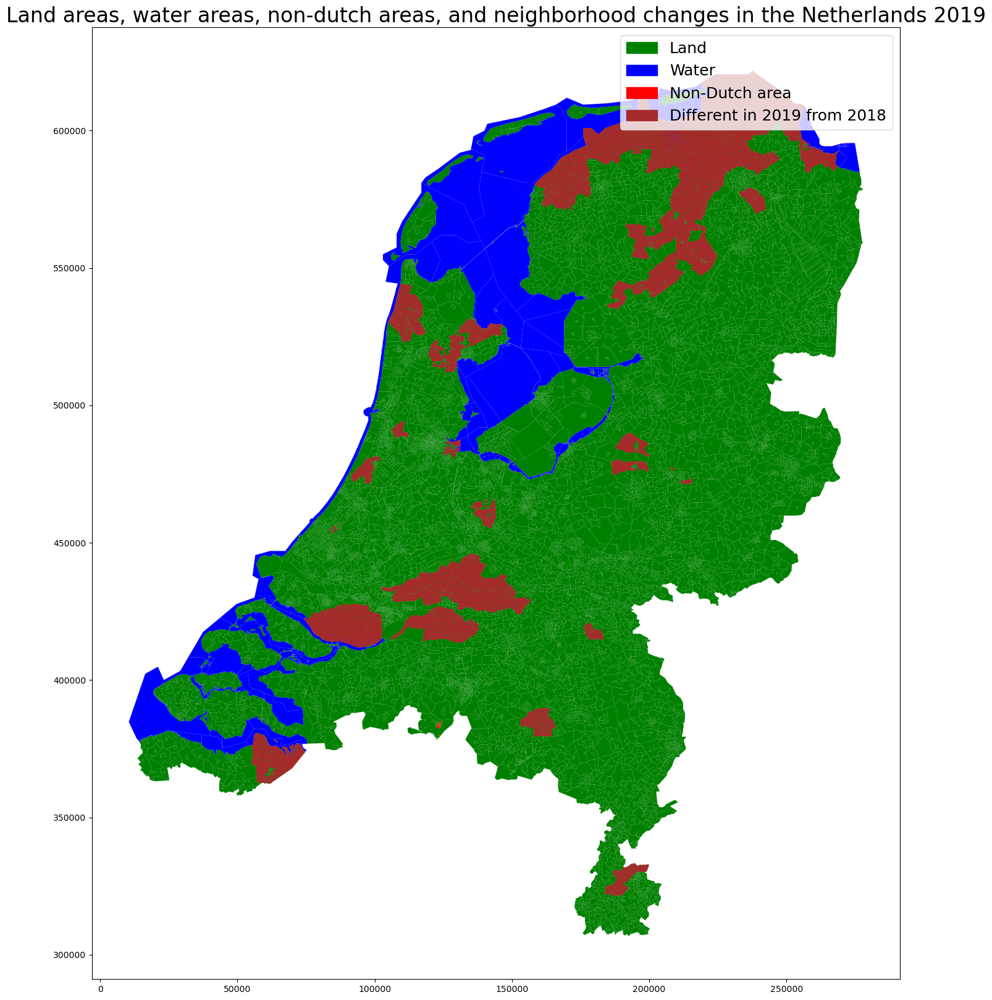

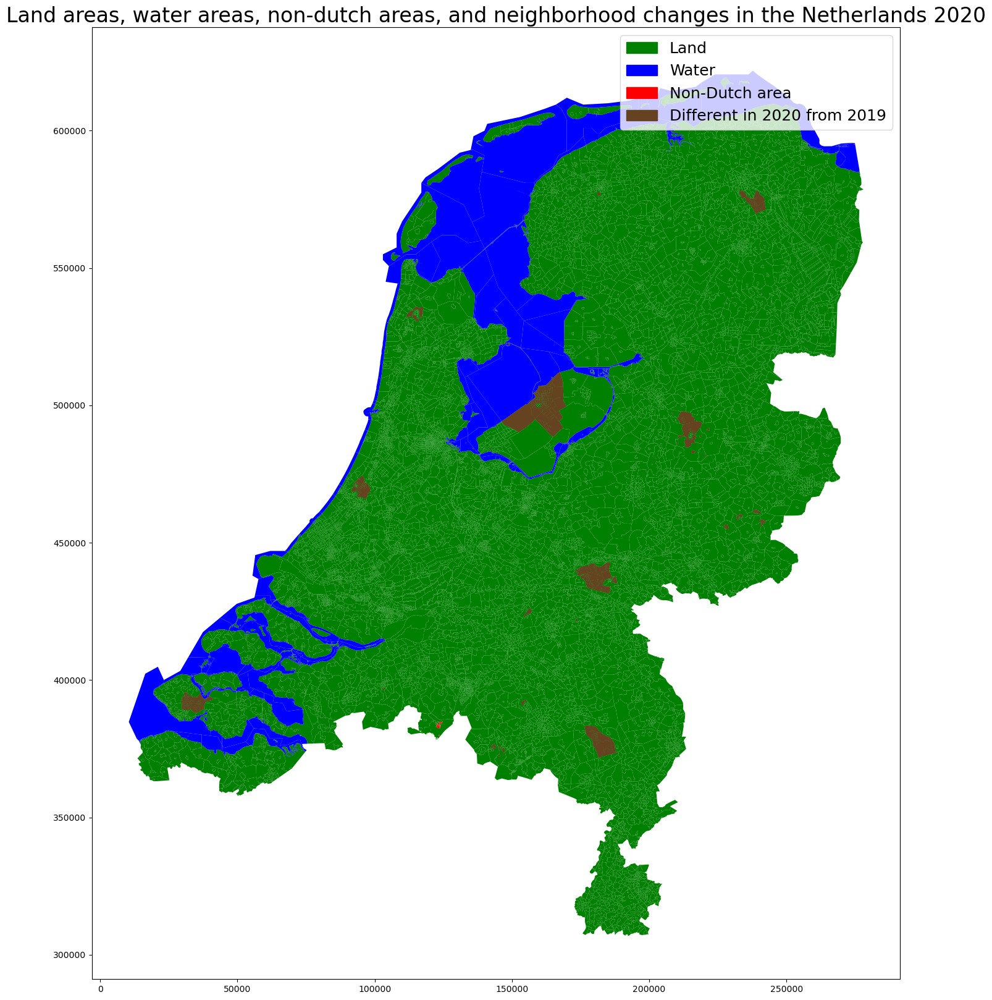

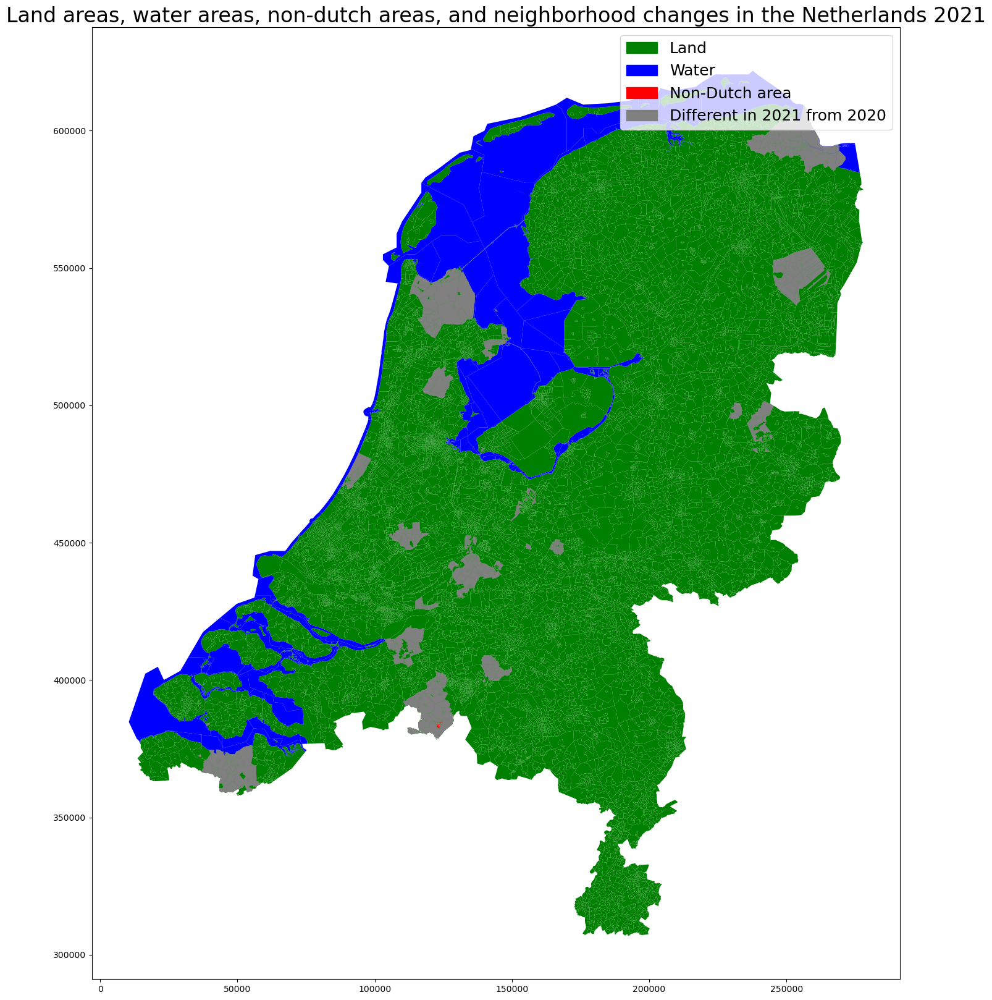

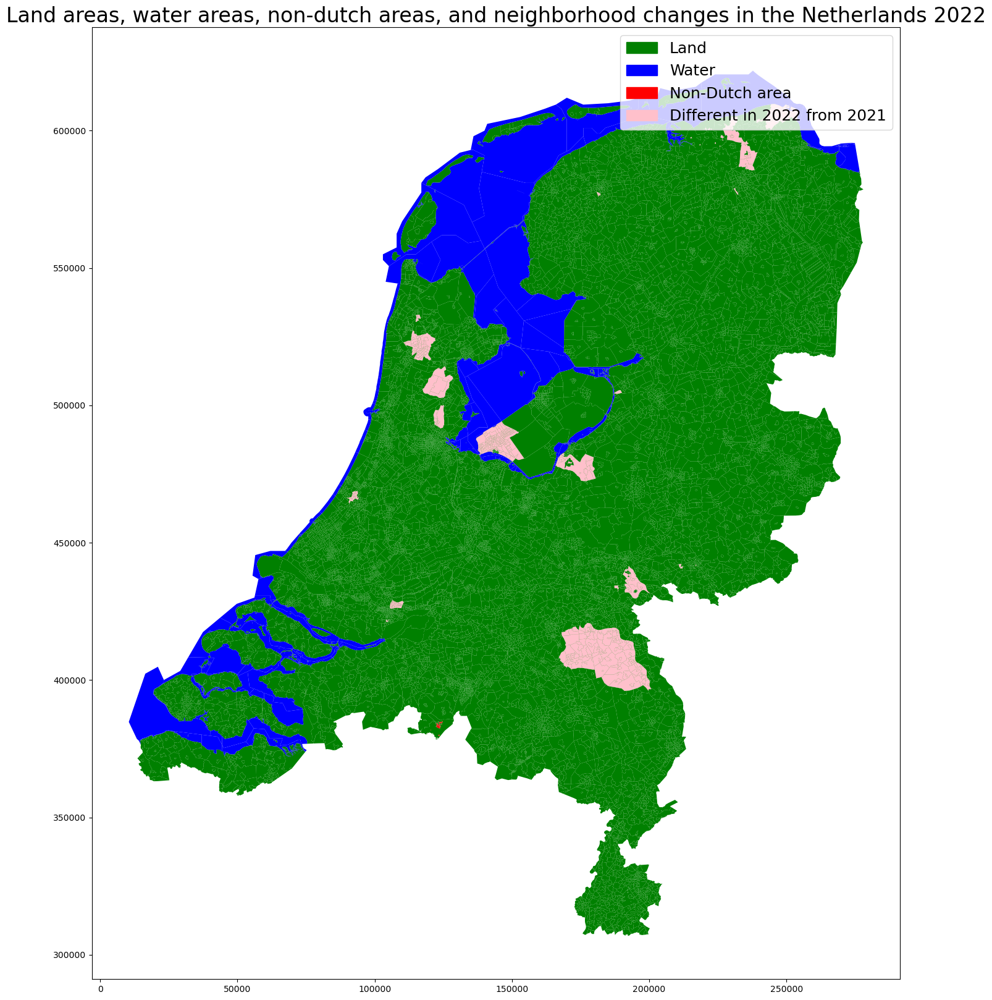

In [12]:
# The metadata of Statistics Nethelands does not specify what the values of the variable Water mean.
# Plotting the neighborhoods, it shows that the 'JA' values are the water areas, the 'NEE' values are the land areas and the 'B' value indicates a non-dutch neighborhood.
# This non-Dutch neighborhood is the Belgian neighborhoods Baarle-Hertog. 
# For every year, a different plot is created to show the land areas, water areas, and non-dutch areas in the Netherlands.

# ------------------------------------------------------------------------------2018------------------------------------------------------------------------------
# Filter the DataFrame for each condition
gdf_water_nee_2018 = geo_2018_MC_order[geo_2018_MC_order['water'] == 'NEE']
gdf_water_ja_2018 = geo_2018_MC_order[geo_2018_MC_order['water'] == 'JA']
gdf_water_B_2018 = geo_2018_MC_order[geo_2018_MC_order['water'] == 'B']

# Create a plot for all neighborhoods with 'water' equal to 'nee' in green
gdf_water_nee_2018.plot(color='green', figsize=(20, 20))

# Overlay the neighborhoods with 'water' equal to 'ja' in blue
gdf_water_ja_2018.plot(ax=plt.gca(), color='blue')

# Overlay the neighborhoods with 'water' equal to 'B' in red
gdf_water_B_2018.plot(ax=plt.gca(), color='red')

# Set the title of the plot
plt.title('Land areas, water areas, and non-dutch areas in the Netherlands 2018', fontsize=24)

# Create legend
green_patch = mpatches.Patch(color='green', label='Land')
blue_patch = mpatches.Patch(color='blue', label='Water')
red_patch = mpatches.Patch(color='red', label='Non-Dutch area')
plt.legend(handles=[green_patch, blue_patch, red_patch], fontsize=18)
plt.show()

# ------------------------------------------------------------------------------2019------------------------------------------------------------------------------
# Filter the DataFrame for each condition
gdf_water_nee_2019 = geo_2019_MC_order[geo_2019_MC_order['water'] == 'NEE']
gdf_water_ja_2019 = geo_2019_MC_order[geo_2019_MC_order['water'] == 'JA']
gdf_water_B_2019 = geo_2019_MC_order[geo_2019_MC_order['water'] == 'B']

# Find the rows in gdf_2019_MC_1 that are not in gdf_2018_MC_1
gdf_diff_1918 = geo_2019_MC_order[~geo_2019_MC_order['buurtcode'].isin(geo_2018_MC_order['buurtcode'])]

# Create a plot for all neighborhoods with 'water' equal to 'nee' in green
gdf_water_nee_2019.plot(color='green', figsize=(20, 20))

# Overlay the neighborhoods with 'water' equal to 'ja' in blue
gdf_water_ja_2019.plot(ax=plt.gca(), color='blue')

# Overlay the neighborhoods with 'water' equal to 'B' in red
gdf_water_B_2019.plot(ax=plt.gca(), color='red')

# Plot the different rows in brown
gdf_diff_1918.plot(ax=plt.gca(), color='brown')

# Set the title of the plot
plt.title('Land areas, water areas, non-dutch areas, and neighborhood changes in the Netherlands 2019', fontsize=24)

# Create legend
green_patch = mpatches.Patch(color='green', label='Land')
blue_patch = mpatches.Patch(color='blue', label='Water')
red_patch = mpatches.Patch(color='red', label='Non-Dutch area')
brown_patch = mpatches.Patch(color='brown', label='Different in 2019 from 2018')
plt.legend(handles=[green_patch, blue_patch, red_patch, brown_patch], fontsize=18)
plt.show()

# ------------------------------------------------------------------------------2020------------------------------------------------------------------------------
# Filter the DataFrame for each condition
gdf_water_nee_2020 = geo_2020_MC_order[geo_2020_MC_order['water'] == 'NEE']
gdf_water_ja_2020 = geo_2020_MC_order[geo_2020_MC_order['water'] == 'JA']
gdf_water_B_2020 = geo_2020_MC_order[geo_2020_MC_order['water'] == 'B']

# Find the rows in gdf_2020_MC_1 that are not in gdf_2018_MC_1
gdf_diff_2019 = geo_2020_MC_order[~geo_2020_MC_order['buurtcode'].isin(geo_2019_MC_order['buurtcode'])]

# Create a plot for all neighborhoods with 'water' equal to 'nee' in green
gdf_water_nee_2020.plot(color='green', figsize=(20, 20))

# Overlay the neighborhoods with 'water' equal to 'ja' in blue
gdf_water_ja_2020.plot(ax=plt.gca(), color='blue')

# Overlay the neighborhoods with 'water' equal to 'B' in red
gdf_water_B_2020.plot(ax=plt.gca(), color='red')

# Plot the difference between 2018 and 2020 rows in dark brown
dark_brown = (101/255, 67/255, 33/255)  # RGB values for dark brown
gdf_diff_2019.plot(ax=plt.gca(), color=dark_brown)

# Set the title of the plot
plt.title('Land areas, water areas, non-dutch areas, and neighborhood changes in the Netherlands 2020', fontsize=24)

# Create legend
green_patch = mpatches.Patch(color='green', label='Land')
blue_patch = mpatches.Patch(color='blue', label='Water')
red_patch = mpatches.Patch(color='red', label='Non-Dutch area')
dark_brown_patch = mpatches.Patch(color=dark_brown, label='Different in 2020 from 2019')
plt.legend(handles=[green_patch, blue_patch, red_patch, dark_brown_patch], fontsize=18)
plt.show()

# ------------------------------------------------------------------------------2021------------------------------------------------------------------------------
# Filter the DataFrame for each condition
gdf_water_nee_2021 = geo_2021_MC_order[geo_2021_MC_order['water'] == 'NEE']
gdf_water_ja_2021 = geo_2021_MC_order[geo_2021_MC_order['water'] == 'JA']
gdf_water_B_2021 = geo_2021_MC_order[geo_2021_MC_order['water'] == 'B']

# Find the rows in gdf_2020_MC_1 that are not in gdf_2018_MC_1
gdf_diff_2120 = geo_2021_MC_order[~geo_2021_MC_order['buurtcode'].isin(geo_2020_MC_order['buurtcode'])]

# Create a plot for all neighborhoods with 'water' equal to 'nee' in green
gdf_water_nee_2021.plot(color='green', figsize=(20, 20))

# Overlay the neighborhoods with 'water' equal to 'ja' in blue
gdf_water_ja_2021.plot(ax=plt.gca(), color='blue')

# Overlay the neighborhoods with 'water' equal to 'B' in red
gdf_water_B_2021.plot(ax=plt.gca(), color='red')

# Plot the difference between 2021 and 2020 rows in grey
gdf_diff_2120.plot(ax=plt.gca(), color='grey')

# Set the title of the plot
plt.title('Land areas, water areas, non-dutch areas, and neighborhood changes in the Netherlands 2021', fontsize=24)

# Create legend
green_patch = mpatches.Patch(color='green', label='Land')
blue_patch = mpatches.Patch(color='blue', label='Water')
red_patch = mpatches.Patch(color='red', label='Non-Dutch area')
grey_patch = mpatches.Patch(color='grey', label='Different in 2021 from 2020')
plt.legend(handles=[green_patch, blue_patch, red_patch, grey_patch], fontsize=18)
plt.show()

# ------------------------------------------------------------------------------2022------------------------------------------------------------------------------
# Filter the DataFrame for each condition
gdf_water_nee_2022 = geo_2022_MC_order[geo_2022_MC_order['water'] == 'NEE']
gdf_water_ja_2022 = geo_2022_MC_order[geo_2022_MC_order['water'] == 'JA']
gdf_water_B_2022 = geo_2022_MC_order[geo_2022_MC_order['water'] == 'B']

# Find the rows in gdf_2020_MC_1 that are not in gdf_2018_MC_1
gdf_diff_2221 = geo_2022_MC_order[~geo_2022_MC_order['buurtcode'].isin(geo_2021_MC_order['buurtcode'])]

# Create a plot for all neighborhoods with 'water' equal to 'nee' in green
gdf_water_nee_2022.plot(color='green', figsize=(20, 20))

# Overlay the neighborhoods with 'water' equal to 'ja' in blue
gdf_water_ja_2022.plot(ax=plt.gca(), color='blue')

# Overlay the neighborhoods with 'water' equal to 'B' in red
gdf_water_B_2022.plot(ax=plt.gca(), color='red')

# Plot the difference between 2021 and 2020 rows in pink
gdf_diff_2221.plot(ax=plt.gca(), color='pink')

# Set the title of the plot
plt.title('Land areas, water areas, non-dutch areas, and neighborhood changes in the Netherlands 2022', fontsize=24)

# Create legend
green_patch = mpatches.Patch(color='green', label='Land')
blue_patch = mpatches.Patch(color='blue', label='Water')
red_patch = mpatches.Patch(color='red', label='Non-Dutch area')
pink_patch = mpatches.Patch(color='pink', label='Different in 2022 from 2021')
plt.legend(handles=[green_patch, blue_patch, red_patch, pink_patch], fontsize=18)
plt.show()


In [13]:
# As it can be seen in the maps that are generated. There are a lot of areas that have obtained a different 'buurtcode', neighborhood code.
# This indicates that there is either a change in geographical boundaries, a change in district, or a change in municipality.
# Therefore, it is chosen to not only use the year 2022 as geographical boundaries since the differences over the years are too large. 
# This would mean that many neighborhoods would not be possible to included, or comparisons would be unfair or biased. 
# Therefore, per respective year, the corresponding neighborhood geometries of that year are used. 

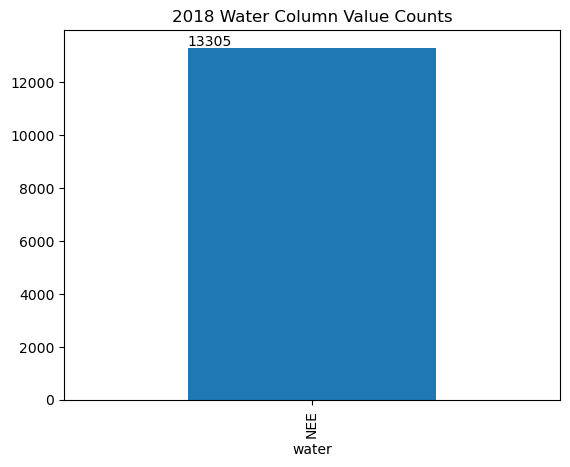

There is no water in the 2018 Statistics Netherlands dataset
There is no foreign land in the 2018 Statistics Netherlands dataset


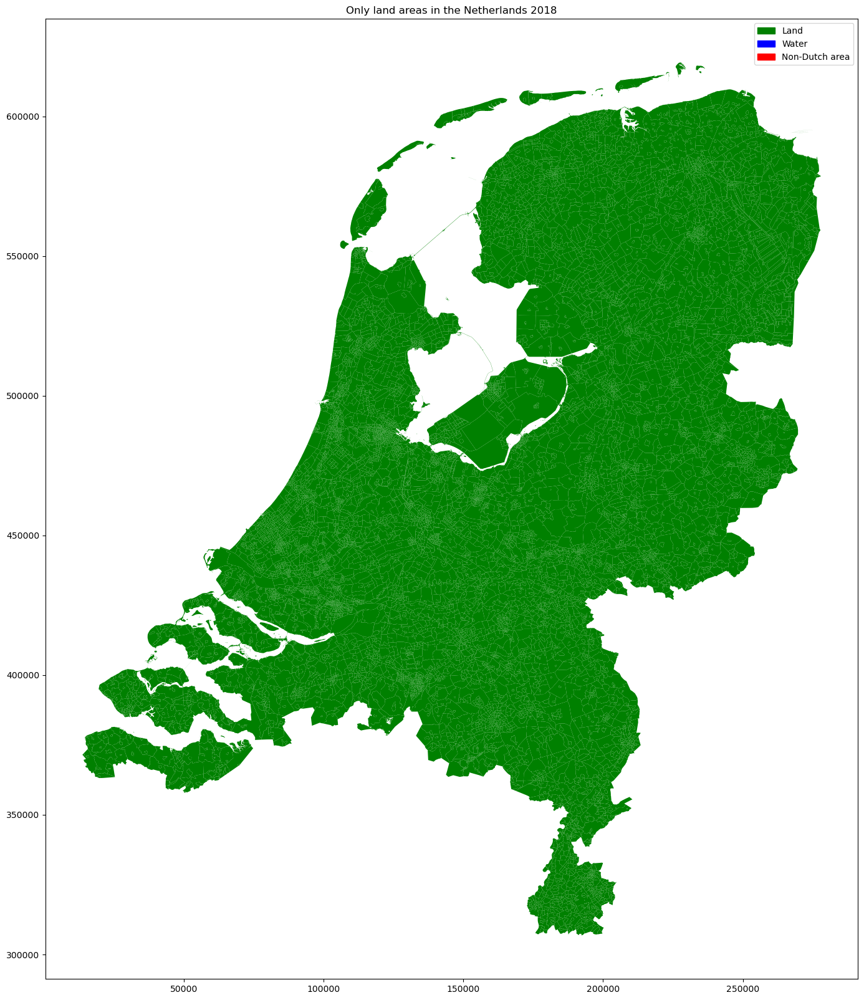

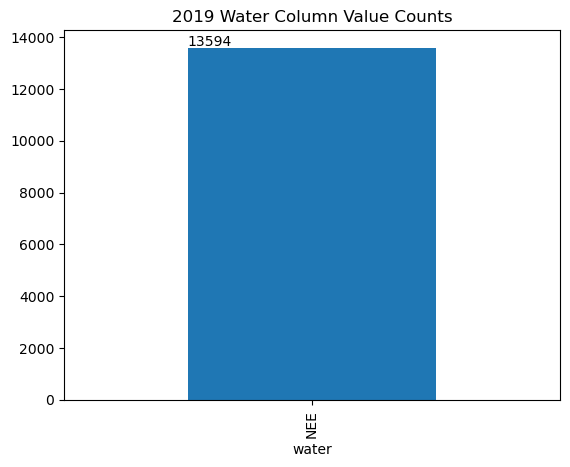

There is no water in the 2019 Statistics Netherlands dataset
There is no foreign land in the 2019 Statistics Netherlands dataset


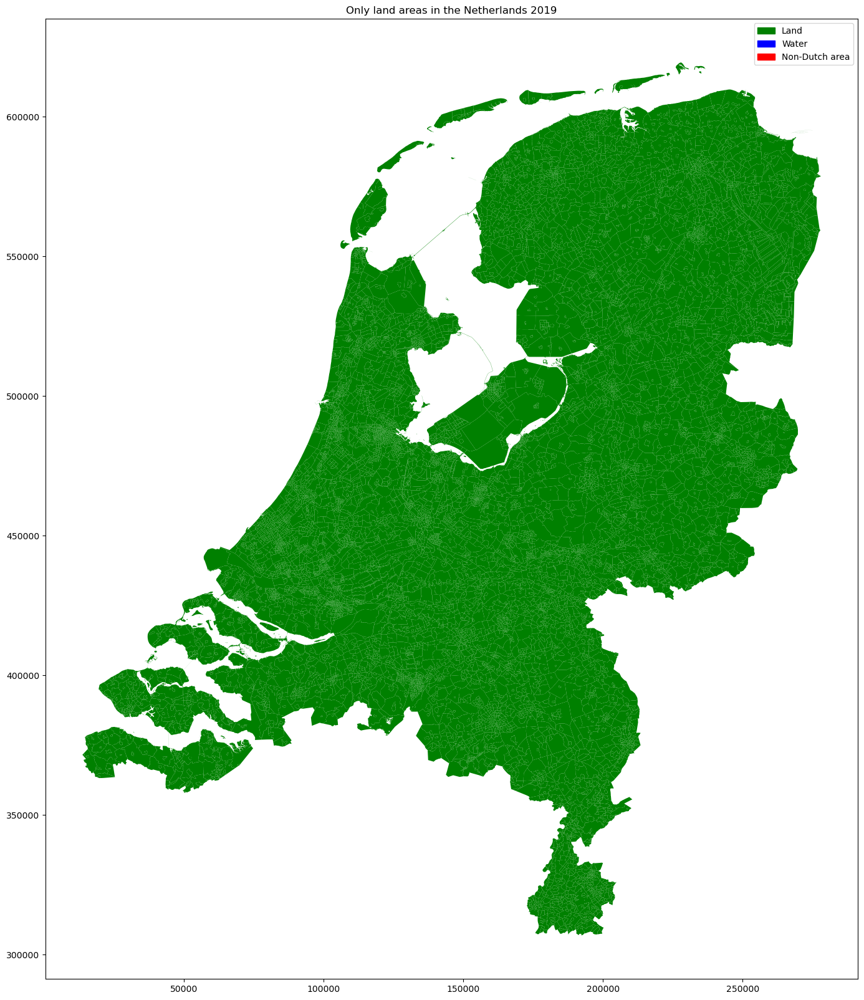

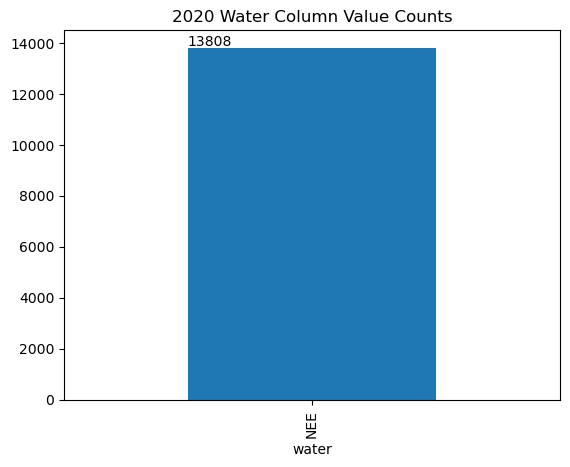

There is no water in the 2020 Statistics Netherlands dataset
There is no foreign land in the 2020 Statistics Netherlands dataset


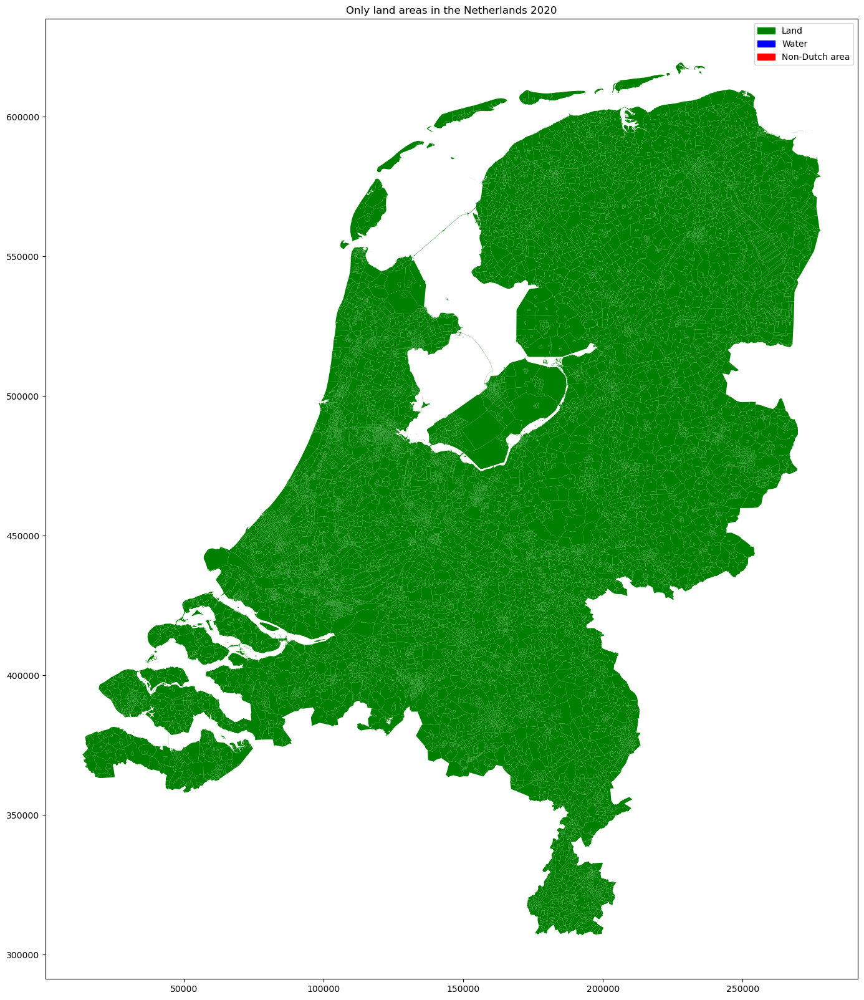

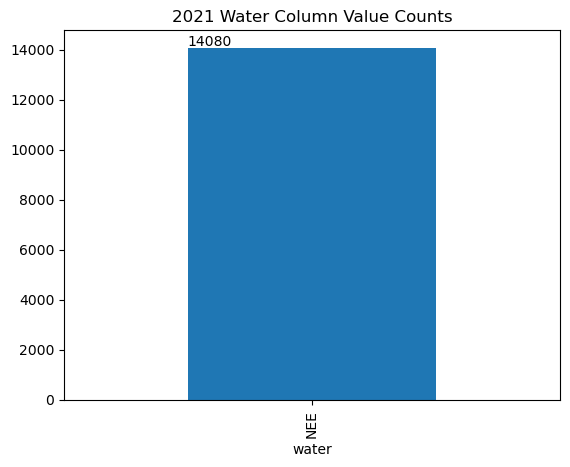

There is no water in the 2021 Statistics Netherlands dataset
There is no foreign land in the 2021 Statistics Netherlands dataset


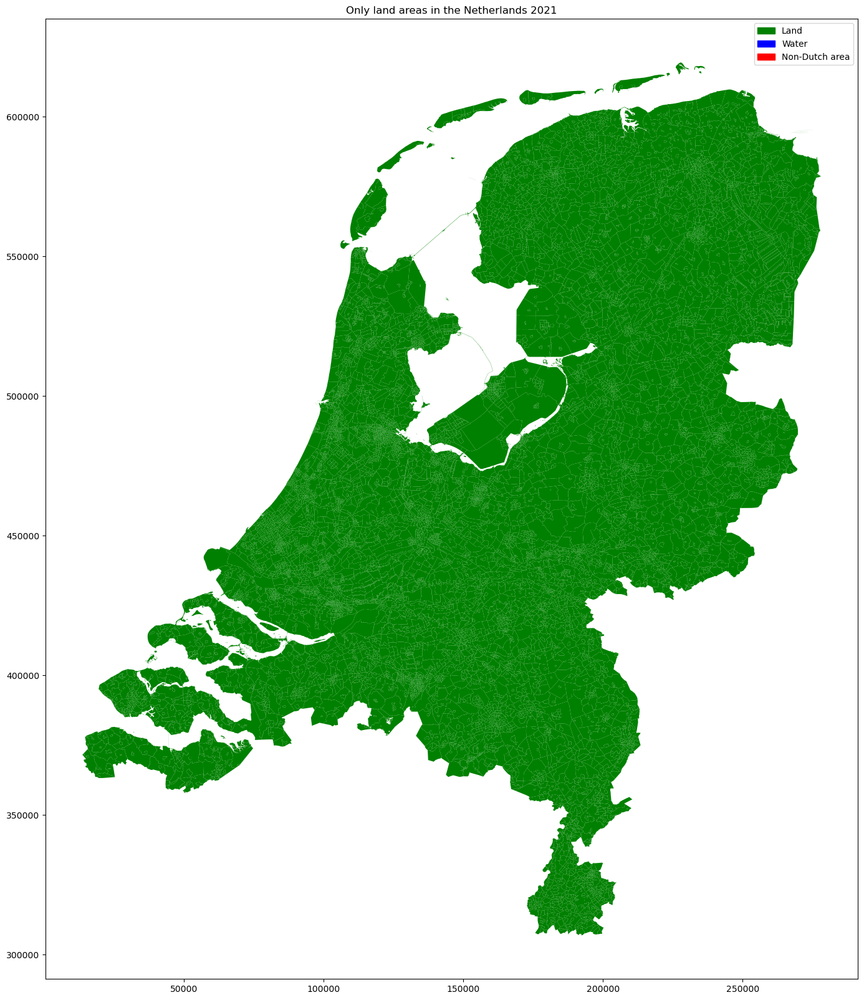

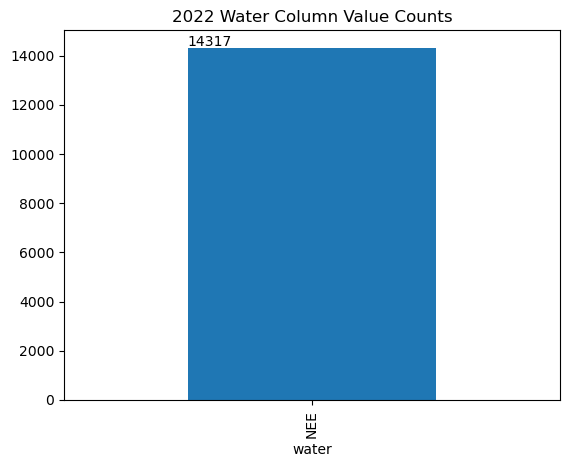

There is no water in the 2022 Statistics Netherlands dataset
There is no foreign land in the 2022 Statistics Netherlands dataset


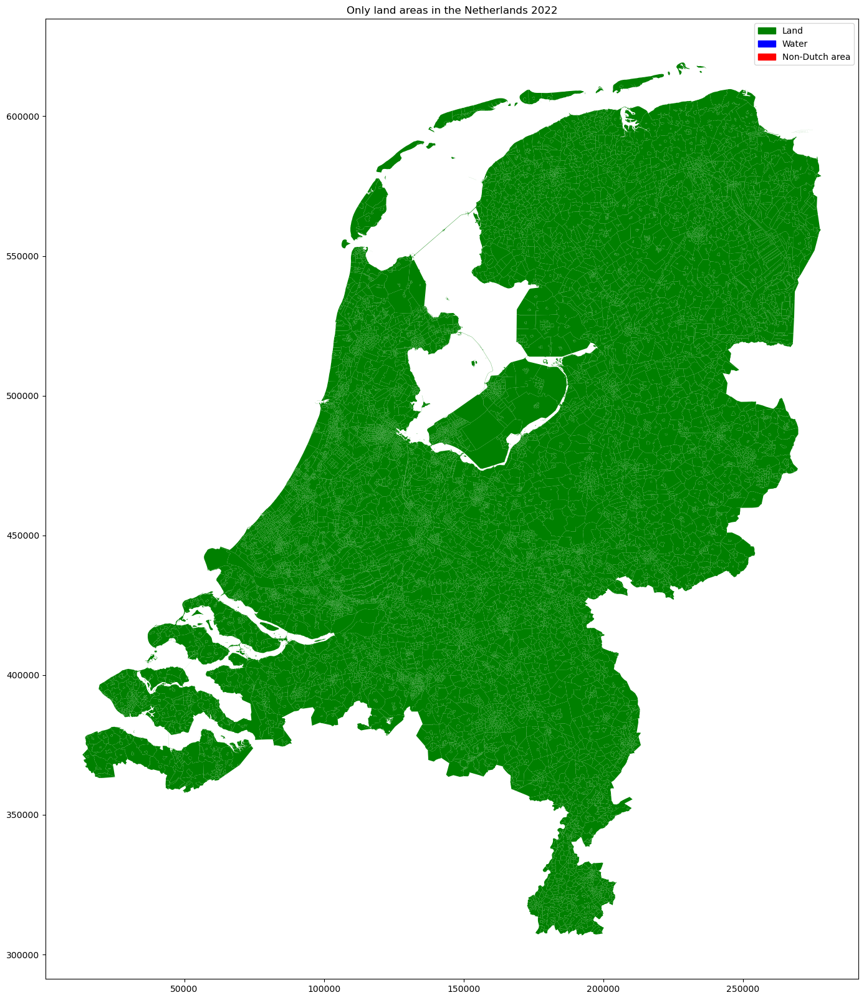

In [14]:
# Now, the geopackage needs to be copied so that the changes that will be done will not be done on the original file.
# This piece of code copies the geopackage and deletes the rows where the column of the variable 'water' is 'JA' or 'B'.
# To indicate that this is done, the bar chart for the water viariable for the new geopackage is plotted again.

# ------------------------------------------------------------------------------2018------------------------------------------------------------------------------

# Create a copy of the DataFrame
geo_2018_MC_order_copy = geo_2018_MC_order.copy()

# Remove the rows where 'water' is 'JA' or 'B'
geo_2018_MC_order_copy_waterdeleted = geo_2018_MC_order_copy[(geo_2018_MC_order_copy['water'] != 'JA') & (geo_2018_MC_order_copy['water'] != 'B')]

# Save the modified DataFrame to a new GeoPackage
geo_2018_MC_order_copy_waterdeleted.to_file("intermediate/Geometry_2018.gpkg", driver="GPKG")

ax2 = geo_2018_MC_order_copy_waterdeleted['water'].value_counts().plot(kind='bar')
ax2.set_title('2018 Water Column Value Counts')
for p in ax2.patches:
    ax2.annotate(str(p.get_height()), (p.get_x() * 1.005, p.get_height() * 1.005))
plt.show()

# This piece of code is used to display the map of the neighborhoods of the new geopackage to indicate that only Dutch land neighborhoods are kept. 

check_water_nee_2018_waterdeleted = geo_2018_MC_order_copy_waterdeleted[geo_2018_MC_order_copy_waterdeleted['water'] == 'NEE']
check_water_ja_2018_waterdeleted = geo_2018_MC_order_copy_waterdeleted[geo_2018_MC_order_copy_waterdeleted['water'] == 'JA']
check_water_B_2018_waterdeleted = geo_2018_MC_order_copy_waterdeleted[geo_2018_MC_order_copy_waterdeleted['water'] == 'B']

# Check if 'water' = 'NEE' exists
if check_water_nee_2018_waterdeleted.empty:
    print("There is no land in the 2018 Statistics Netherlands dataset")
else:
    # Create a plot for all neighborhoods with 'water' equal to 'NEE' in green
    check_water_nee_2018_waterdeleted.plot(color='green', figsize=(20, 20))

# Check if 'water' = 'JA' exists
if check_water_ja_2018_waterdeleted.empty:
    print("There is no water in the 2018 Statistics Netherlands dataset")
else:
    # Overlay the neighborhoods with 'water' equal to 'JA' in blue
    check_water_ja_2018_waterdeleted.plot(ax=plt.gca(), color='blue')

# Check if 'water' = 'B' exists
if check_water_B_2018_waterdeleted.empty:
    print("There is no foreign land in the 2018 Statistics Netherlands dataset")
else:
    # Overlay the neighborhoods with 'water' equal to 'B' in red
    check_water_B_2018_waterdeleted.plot(ax=plt.gca(), color='red')

# Set the title of the plot
plt.title('Only land areas in the Netherlands 2018')

# Create legend
green_patch = mpatches.Patch(color='green', label='Land')
blue_patch = mpatches.Patch(color='blue', label='Water')
red_patch = mpatches.Patch(color='red', label='Non-Dutch area')
plt.legend(handles=[green_patch, blue_patch, red_patch])

# Show the plot
plt.show()

# ------------------------------------------------------------------------------2019------------------------------------------------------------------------------

# Create a copy of the DataFrame
geo_2019_MC_order_copy = geo_2019_MC_order.copy()

# Remove the rows where 'water' is 'JA' or 'B'
geo_2019_MC_order_copy_waterdeleted = geo_2019_MC_order_copy[(geo_2019_MC_order_copy['water'] != 'JA') & (geo_2019_MC_order_copy['water'] != 'B')]

# Save the modified DataFrame to a new GeoPackage
geo_2019_MC_order_copy_waterdeleted.to_file("intermediate/Geometry_2019.gpkg", driver="GPKG")

ax2 = geo_2019_MC_order_copy_waterdeleted['water'].value_counts().plot(kind='bar')
ax2.set_title('2019 Water Column Value Counts')
for p in ax2.patches:
    ax2.annotate(str(p.get_height()), (p.get_x() * 1.005, p.get_height() * 1.005))
plt.show()

# This piece of code is used to display the map of the neighborhoods of the new geopackage to indicate that only Dutch land neighborhoods are kept. 

check_water_nee_2019_waterdeleted = geo_2019_MC_order_copy_waterdeleted[geo_2019_MC_order_copy_waterdeleted['water'] == 'NEE']
check_water_ja_2019_waterdeleted = geo_2019_MC_order_copy_waterdeleted[geo_2019_MC_order_copy_waterdeleted['water'] == 'JA']
check_water_B_2019_waterdeleted = geo_2019_MC_order_copy_waterdeleted[geo_2019_MC_order_copy_waterdeleted['water'] == 'B']

# Check if 'water' = 'NEE' exists
if check_water_nee_2019_waterdeleted.empty:
    print("There is no land in the 2019 Statistics Netherlands dataset")
else:
    # Create a plot for all neighborhoods with 'water' equal to 'NEE' in green
    check_water_nee_2019_waterdeleted.plot(color='green', figsize=(20, 20))

# Check if 'water' = 'JA' exists
if check_water_ja_2019_waterdeleted.empty:
    print("There is no water in the 2019 Statistics Netherlands dataset")
else:
    # Overlay the neighborhoods with 'water' equal to 'JA' in blue
    check_water_ja_2019_waterdeleted.plot(ax=plt.gca(), color='blue')

# Check if 'water' = 'B' exists
if check_water_B_2019_waterdeleted.empty:
    print("There is no foreign land in the 2019 Statistics Netherlands dataset")
else:
    # Overlay the neighborhoods with 'water' equal to 'B' in red
    check_water_B_2019_waterdeleted.plot(ax=plt.gca(), color='red')

# Set the title of the plot
plt.title('Only land areas in the Netherlands 2019')

# Create legend
green_patch = mpatches.Patch(color='green', label='Land')
blue_patch = mpatches.Patch(color='blue', label='Water')
red_patch = mpatches.Patch(color='red', label='Non-Dutch area')
plt.legend(handles=[green_patch, blue_patch, red_patch])

# Show the plot
plt.show()

# ------------------------------------------------------------------------------2020------------------------------------------------------------------------------

# Create a copy of the DataFrame
geo_2020_MC_order_copy = geo_2020_MC_order.copy()

# Remove the rows where 'water' is 'JA' or 'B'
geo_2020_MC_order_copy_waterdeleted = geo_2020_MC_order_copy[(geo_2020_MC_order_copy['water'] != 'JA') & (geo_2020_MC_order_copy['water'] != 'B')]

# Save the modified DataFrame to a new GeoPackage
geo_2020_MC_order_copy_waterdeleted.to_file("intermediate/Geometry_2020.gpkg", driver="GPKG")

ax2 = geo_2020_MC_order_copy_waterdeleted['water'].value_counts().plot(kind='bar')
ax2.set_title('2020 Water Column Value Counts')
for p in ax2.patches:
    ax2.annotate(str(p.get_height()), (p.get_x() * 1.005, p.get_height() * 1.005))
plt.show()

# This piece of code is used to display the map of the neighborhoods of the new geopackage to indicate that only Dutch land neighborhoods are kept. 

check_water_nee_2020_waterdeleted = geo_2020_MC_order_copy_waterdeleted[geo_2020_MC_order_copy_waterdeleted['water'] == 'NEE']
check_water_ja_2020_waterdeleted = geo_2020_MC_order_copy_waterdeleted[geo_2020_MC_order_copy_waterdeleted['water'] == 'JA']
check_water_B_2020_waterdeleted = geo_2020_MC_order_copy_waterdeleted[geo_2020_MC_order_copy_waterdeleted['water'] == 'B']

# Check if 'water' = 'NEE' exists
if check_water_nee_2020_waterdeleted.empty:
    print("There is no land in the 2020 Statistics Netherlands dataset")
else:
    # Create a plot for all neighborhoods with 'water' equal to 'NEE' in green
    check_water_nee_2020_waterdeleted.plot(color='green', figsize=(20, 20))

# Check if 'water' = 'JA' exists
if check_water_ja_2020_waterdeleted.empty:
    print("There is no water in the 2020 Statistics Netherlands dataset")
else:
    # Overlay the neighborhoods with 'water' equal to 'JA' in blue
    check_water_ja_2020_waterdeleted.plot(ax=plt.gca(), color='blue')

# Check if 'water' = 'B' exists
if check_water_B_2020_waterdeleted.empty:
    print("There is no foreign land in the 2020 Statistics Netherlands dataset")
else:
    # Overlay the neighborhoods with 'water' equal to 'B' in red
    check_water_B_2020_waterdeleted.plot(ax=plt.gca(), color='red')

# Set the title of the plot
plt.title('Only land areas in the Netherlands 2020')

# Create legend
green_patch = mpatches.Patch(color='green', label='Land')
blue_patch = mpatches.Patch(color='blue', label='Water')
red_patch = mpatches.Patch(color='red', label='Non-Dutch area')
plt.legend(handles=[green_patch, blue_patch, red_patch])

# Show the plot
plt.show()

# ------------------------------------------------------------------------------2021------------------------------------------------------------------------------

# Create a copy of the DataFrame
geo_2021_MC_order_copy = geo_2021_MC_order.copy()

# Remove the rows where 'water' is 'JA' or 'B'
geo_2021_MC_order_copy_waterdeleted = geo_2021_MC_order_copy[(geo_2021_MC_order_copy['water'] != 'JA') & (geo_2021_MC_order_copy['water'] != 'B')]

# Save the modified DataFrame to a new GeoPackage
geo_2021_MC_order_copy_waterdeleted.to_file("intermediate/Geometry_2021.gpkg", driver="GPKG")

ax2 = geo_2021_MC_order_copy_waterdeleted['water'].value_counts().plot(kind='bar')
ax2.set_title('2021 Water Column Value Counts')
for p in ax2.patches:
    ax2.annotate(str(p.get_height()), (p.get_x() * 1.005, p.get_height() * 1.005))
plt.show()

# This piece of code is used to display the map of the neighborhoods of the new geopackage to indicate that only Dutch land neighborhoods are kept. 

check_water_nee_2021_waterdeleted = geo_2021_MC_order_copy_waterdeleted[geo_2021_MC_order_copy_waterdeleted['water'] == 'NEE']
check_water_ja_2021_waterdeleted = geo_2021_MC_order_copy_waterdeleted[geo_2021_MC_order_copy_waterdeleted['water'] == 'JA']
check_water_B_2021_waterdeleted = geo_2021_MC_order_copy_waterdeleted[geo_2021_MC_order_copy_waterdeleted['water'] == 'B']

# Check if 'water' = 'NEE' exists
if check_water_nee_2021_waterdeleted.empty:
    print("There is no land in the 2021 Statistics Netherlands dataset")
else:
    # Create a plot for all neighborhoods with 'water' equal to 'NEE' in green
    check_water_nee_2021_waterdeleted.plot(color='green', figsize=(20, 20))

# Check if 'water' = 'JA' exists
if check_water_ja_2021_waterdeleted.empty:
    print("There is no water in the 2021 Statistics Netherlands dataset")
else:
    # Overlay the neighborhoods with 'water' equal to 'JA' in blue
    check_water_ja_2021_waterdeleted.plot(ax=plt.gca(), color='blue')

# Check if 'water' = 'B' exists
if check_water_B_2021_waterdeleted.empty:
    print("There is no foreign land in the 2021 Statistics Netherlands dataset")
else:
    # Overlay the neighborhoods with 'water' equal to 'B' in red
    check_water_B_2021_waterdeleted.plot(ax=plt.gca(), color='red')

# Set the title of the plot
plt.title('Only land areas in the Netherlands 2021')

# Create legend
green_patch = mpatches.Patch(color='green', label='Land')
blue_patch = mpatches.Patch(color='blue', label='Water')
red_patch = mpatches.Patch(color='red', label='Non-Dutch area')
plt.legend(handles=[green_patch, blue_patch, red_patch])

# Show the plot
plt.show()

# ------------------------------------------------------------------------------2022------------------------------------------------------------------------------

# Create a copy of the DataFrame
geo_2022_MC_order_copy = geo_2022_MC_order.copy()

# Remove the rows where 'water' is 'JA' or 'B'
geo_2022_MC_order_copy_waterdeleted = geo_2022_MC_order_copy[(geo_2022_MC_order_copy['water'] != 'JA') & (geo_2022_MC_order_copy['water'] != 'B')]

# Save the modified DataFrame to a new GeoPackage
geo_2022_MC_order_copy_waterdeleted.to_file("intermediate/Geometry_2022.gpkg", driver="GPKG")

ax2 = geo_2022_MC_order_copy_waterdeleted['water'].value_counts().plot(kind='bar')
ax2.set_title('2022 Water Column Value Counts')
for p in ax2.patches:
    ax2.annotate(str(p.get_height()), (p.get_x() * 1.005, p.get_height() * 1.005))
plt.show()

# This piece of code is used to display the map of the neighborhoods of the new geopackage to indicate that only Dutch land neighborhoods are kept. 

check_water_nee_2022_waterdeleted = geo_2022_MC_order_copy_waterdeleted[geo_2022_MC_order_copy_waterdeleted['water'] == 'NEE']
check_water_ja_2022_waterdeleted = geo_2022_MC_order_copy_waterdeleted[geo_2022_MC_order_copy_waterdeleted['water'] == 'JA']
check_water_B_2022_waterdeleted = geo_2022_MC_order_copy_waterdeleted[geo_2022_MC_order_copy_waterdeleted['water'] == 'B']

# Check if 'water' = 'NEE' exists
if check_water_nee_2022_waterdeleted.empty:
    print("There is no land in the 2022 Statistics Netherlands dataset")
else:
    # Create a plot for all neighborhoods with 'water' equal to 'NEE' in green
    check_water_nee_2022_waterdeleted.plot(color='green', figsize=(20, 20))

# Check if 'water' = 'JA' exists
if check_water_ja_2022_waterdeleted.empty:
    print("There is no water in the 2022 Statistics Netherlands dataset")
else:
    # Overlay the neighborhoods with 'water' equal to 'JA' in blue
    check_water_ja_2022_waterdeleted.plot(ax=plt.gca(), color='blue')

# Check if 'water' = 'B' exists
if check_water_B_2022_waterdeleted.empty:
    print("There is no foreign land in the 2022 Statistics Netherlands dataset")
else:
    # Overlay the neighborhoods with 'water' equal to 'B' in red
    check_water_B_2022_waterdeleted.plot(ax=plt.gca(), color='red')

# Set the title of the plot
plt.title('Only land areas in the Netherlands 2022')

# Create legend
green_patch = mpatches.Patch(color='green', label='Land')
blue_patch = mpatches.Patch(color='blue', label='Water')
red_patch = mpatches.Patch(color='red', label='Non-Dutch area')
plt.legend(handles=[green_patch, blue_patch, red_patch])

# Show the plot
plt.show()

In [15]:
# The intermediate result is stored in a new geopackage. This 
geo_2018_MC_order_copy_waterdeleted.to_file("intermediate/geometry_2018_DS.gpkg", driver="GPKG")
geo_2019_MC_order_copy_waterdeleted.to_file("intermediate/geometry_2019_DS.gpkg", driver="GPKG")
geo_2020_MC_order_copy_waterdeleted.to_file("intermediate/geometry_2020_DS.gpkg", driver="GPKG")
geo_2021_MC_order_copy_waterdeleted.to_file("intermediate/geometry_2021_DS.gpkg", driver="GPKG")
geo_2022_MC_order_copy_waterdeleted.to_file("intermediate/geometry_2022_DS.gpkg", driver="GPKG")

In [16]:
# To check if the datasets are saved read correctly, the first 5 rows of each dataset are displayed.
# The paths below indicate the local paths of the datasets on the PC of the user. The user needs to replace the paths with the paths on their own PC.
# Locating the Statistic Netherlands (SN) datasets and giving easy names
UNCLEANED_SN_2018_location = r'C:\Users\20182306\OneDrive - TU Eindhoven\Documents\We-Boost\Repositories\Mobility-Index\intermediate\geometry_2018_DS.gpkg'
UNCLEANED_SN_2019_location = r'C:\Users\20182306\OneDrive - TU Eindhoven\Documents\We-Boost\Repositories\Mobility-Index\intermediate\geometry_2019_DS.gpkg'
UNCLEANED_SN_2020_location = r'C:\Users\20182306\OneDrive - TU Eindhoven\Documents\We-Boost\Repositories\Mobility-Index\intermediate\geometry_2020_DS.gpkg'
UNCLEANED_SN_2021_location = r'C:\Users\20182306\OneDrive - TU Eindhoven\Documents\We-Boost\Repositories\Mobility-Index\intermediate\geometry_2021_DS.gpkg'
UNCLEANED_SN_2022_location = r'C:\Users\20182306\OneDrive - TU Eindhoven\Documents\We-Boost\Repositories\Mobility-Index\intermediate\geometry_2022_DS.gpkg'

# Reading the chanted ODIN datasets which contain only the same columns. 
SN_2018 = gpd.read_file(UNCLEANED_SN_2018_location)
SN_2019 = gpd.read_file(UNCLEANED_SN_2019_location)
SN_2020 = gpd.read_file(UNCLEANED_SN_2020_location)
SN_2021 = gpd.read_file(UNCLEANED_SN_2021_location)
SN_2022 = gpd.read_file(UNCLEANED_SN_2022_location)

# To check if the datasets are changed read correctly, the first 5 rows of each dataset are displayed.
display(SN_2018.head(5))
display(SN_2019.head(5))
display(SN_2020.head(5))
display(SN_2021.head(5))
display(SN_2022.head(5))

# Check if the lengths of the datasets match with the previous cell output. 
len(SN_2018), len(SN_2019), len(SN_2020), len(SN_2021), len(SN_2022)

,buurtcode,buurtnaam,wijkcode,gemeentecode,gemeentenaam,indelingswijzigingwijkenenbuurten,water,meestvoorkomendepostcode,dekkingspercentage,omgevingsadressendichtheid,...,percentagenietwestersemigratieachtergrond,percentageuitmarokko,percentageuitnederlandseantillenenaruba,percentageuitsuriname,percentageuitturkije,percentageoverigenietwestersemigratieachtergrond,oppervlaktetotaalinha,oppervlaktelandinha,oppervlaktewaterinha,geometry
0,BU00030000,Appingedam-Centrum,WK000300,GM0003,Appingedam,1,NEE,9901,1,1195,...,4,0,1,0,0,2,90,84,5,"MULTIPOLYGON (((252643.203 594343.688, 252604...."
1,BU00030001,Appingedam-West,WK000300,GM0003,Appingedam,1,NEE,9903,5,896,...,4,0,1,0,1,2,163,158,5,"MULTIPOLYGON (((251260.496 594393.830, 251260...."
2,BU00030002,Appingedam-Oost,WK000300,GM0003,Appingedam,1,NEE,9902,1,1119,...,10,1,1,1,4,4,295,284,11,"MULTIPOLYGON (((253641.500 594417.813, 253617...."
3,BU00030007,Verspreide huizen Damsterdiep en Eemskanaal,WK000300,GM0003,Appingedam,1,NEE,9903,4,348,...,2,-99999999,-99999999,-99999999,-99999999,-99999999,559,540,18,"MULTIPOLYGON (((249539.950 593217.579, 249533...."
4,BU00030008,Verspreide huizen ten zuiden van Eemskanaal,WK000300,GM0003,Appingedam,1,NEE,9902,1,74,...,1,-99999999,-99999999,-99999999,-99999999,-99999999,582,554,28,"MULTIPOLYGON (((254983.248 592485.983, 254956...."


,buurtcode,buurtnaam,wijkcode,gemeentecode,gemeentenaam,indelingswijzigingwijkenenbuurten,water,meestvoorkomendepostcode,dekkingspercentage,omgevingsadressendichtheid,...,percentagenietwestersemigratieachtergrond,percentageuitmarokko,percentageuitnederlandseantillenenaruba,percentageuitsuriname,percentageuitturkije,percentageoverigenietwestersemigratieachtergrond,oppervlaktetotaalinha,oppervlaktelandinha,oppervlaktewaterinha,geometry
0,BU00030000,Appingedam-Centrum,WK000300,GM0003,Appingedam,1,NEE,9901,1,1210,...,4,0,1,0,0,2,90,84,5,"MULTIPOLYGON (((252643.203 594343.688, 252674...."
1,BU00030001,Appingedam-West,WK000300,GM0003,Appingedam,1,NEE,9903,6,903,...,4,0,1,0,1,2,163,158,5,"MULTIPOLYGON (((251260.496 594393.830, 251261...."
2,BU00030002,Appingedam-Oost,WK000300,GM0003,Appingedam,1,NEE,9902,1,1140,...,11,1,1,1,4,4,295,284,11,"MULTIPOLYGON (((254580.674 594573.506, 254580...."
3,BU00030007,Verspreide huizen Damsterdiep en Eemskanaal,WK000300,GM0003,Appingedam,1,NEE,9903,4,359,...,2,-99999999,-99999999,-99999999,-99999999,-99999999,559,540,18,"MULTIPOLYGON (((249539.950 593217.579, 249669...."
4,BU00030008,Verspreide huizen ten zuiden van Eemskanaal,WK000300,GM0003,Appingedam,1,NEE,9902,1,79,...,1,-99999999,-99999999,-99999999,-99999999,-99999999,582,554,28,"MULTIPOLYGON (((254809.060 592703.148, 254809...."


,buurtcode,buurtnaam,wijkcode,gemeentecode,gemeentenaam,indelingswijzigingwijkenenbuurten,water,meestvoorkomendepostcode,dekkingspercentage,omgevingsadressendichtheid,...,percentagenietwestersemigratieachtergrond,percentageuitmarokko,percentageuitnederlandseantillenenaruba,percentageuitsuriname,percentageuitturkije,percentageoverigenietwestersemigratieachtergrond,oppervlaktetotaalinha,oppervlaktelandinha,oppervlaktewaterinha,geometry
0,BU00030000,Appingedam-Centrum,WK000300,GM0003,Appingedam,1,NEE,9901,1,1209,...,5,0,1,1,0,3,90,84,5,"MULTIPOLYGON (((253552.594 594537.625, 253607...."
1,BU00030001,Appingedam-West,WK000300,GM0003,Appingedam,1,NEE,9903,6,902,...,4,0,1,0,1,2,163,158,5,"MULTIPOLYGON (((251866.000 594423.375, 252643...."
2,BU00030002,Appingedam-Oost,WK000300,GM0003,Appingedam,1,NEE,9902,1,1138,...,11,1,1,1,4,4,295,284,11,"MULTIPOLYGON (((254580.774 594572.707, 254578...."
3,BU00030007,Verspreide huizen Damsterdiep en Eemskanaal,WK000300,GM0003,Appingedam,1,NEE,9903,4,362,...,2,-99999999,-99999999,-99999999,-99999999,-99999999,559,540,18,"MULTIPOLYGON (((251082.797 593522.500, 251235...."
4,BU00030008,Verspreide huizen ten zuiden van Eemskanaal,WK000300,GM0003,Appingedam,1,NEE,9902,1,79,...,1,-99999999,-99999999,-99999999,-99999999,-99999999,582,554,28,"MULTIPOLYGON (((254809.461 592701.710, 254809...."


,buurtcode,buurtnaam,wijkcode,gemeentecode,gemeentenaam,indelingswijzigingwijkenenbuurten,water,meestvoorkomendepostcode,dekkingspercentage,omgevingsadressendichtheid,...,percentagenietwestersemigratieachtergrond,percentageuitmarokko,percentageuitnederlandseantillenenaruba,percentageuitsuriname,percentageuitturkije,percentageoverigenietwestersemigratieachtergrond,oppervlaktetotaalinha,oppervlaktelandinha,oppervlaktewaterinha,geometry
0,BU00140000,Binnenstad-Noord,WK001400,GM0014,Groningen,1,NEE,9712,1,6561,...,10,0,1,1,1,8,39,37,2,"MULTIPOLYGON (((233836.216 582380.178, 233892...."
1,BU00140001,Binnenstad-Zuid,WK001400,GM0014,Groningen,1,NEE,9711,1,6260,...,12,0,1,1,1,8,59,55,4,"MULTIPOLYGON (((233933.980 581951.340, 233973...."
2,BU00140002,Binnenstad-Oost,WK001400,GM0014,Groningen,1,NEE,9711,3,6037,...,14,1,2,1,1,10,29,27,2,"MULTIPOLYGON (((233998.790 582526.540, 234278...."
3,BU00140003,Binnenstad-West,WK001400,GM0014,Groningen,1,NEE,9718,1,6145,...,10,0,0,1,1,8,11,10,1,"MULTIPOLYGON (((233187.240 581984.190, 233217...."
4,BU00140004,Noorderplantsoen,WK001400,GM0014,Groningen,1,NEE,9717,2,6200,...,-99999999,-99999999,-99999999,-99999999,-99999999,-99999999,20,17,3,"MULTIPOLYGON (((233379.790 582869.670, 233404...."


,buurtcode,buurtnaam,wijkcode,gemeentecode,gemeentenaam,indelingswijzigingwijkenenbuurten,water,meestvoorkomendepostcode,dekkingspercentage,omgevingsadressendichtheid,...,percentagenietwestersemigratieachtergrond,percentageuitmarokko,percentageuitnederlandseantillenenaruba,percentageuitsuriname,percentageuitturkije,percentageoverigenietwestersemigratieachtergrond,oppervlaktetotaalinha,oppervlaktelandinha,oppervlaktewaterinha,geometry
0,BU00140000,Binnenstad-Noord,WK001400,GM0014,Groningen,1,NEE,9712,1,6712,...,11,0,1,1,1,8,39,37,2,"MULTIPOLYGON (((233836.216 582380.178, 233892...."
1,BU06640551,De Schenge,WK066405,GM0664,Goes,1,NEE,4458,2,59,...,2,-99999999,-99999999,-99999999,-99999999,-99999999,686,684,2,"MULTIPOLYGON (((41705.501 393496.029, 41711.06..."
2,BU18960310,Streukel-Holten-Genne,WK189603,GM1896,Zwartewaterland,1,NEE,8061,1,62,...,1,-99999999,-99999999,-99999999,-99999999,-99999999,1207,1172,35,"MULTIPOLYGON (((203761.286 511735.946, 203789...."
3,BU03922001,Zuid-Schalkwijkerweg,WK039220,GM0392,Haarlem,1,NEE,2034,1,1763,...,5,0,0,3,0,2,87,77,9,"MULTIPOLYGON (((104254.281 485378.173, 104260...."
4,BU18760403,Drempt,WK187604,GM1876,Bronckhorst,1,NEE,6996,1,159,...,4,0,0,0,1,3,42,42,0,"MULTIPOLYGON (((209339.203 447081.813, 209266...."


(13305, 13594, 13808, 14080, 14317)

In [17]:
# This piece of code identifies the data types of the columns in the datasets.
# It can be seen that the columns are correctly identified already, no adaptation is needed. 

# Check the datatypes of the Statistics Netherlands for 2018
# Identify numerical columns
numerical_cols_SN_2018 = SN_2018.select_dtypes(include=['int64', 'float64']).columns
# Identify categorical columns
categorical_cols_SN_2018 = SN_2018.select_dtypes(include=['object', 'bool', 'category']).columns
# Print the output of the previous two lines
print('Numerical columns:', numerical_cols_SN_2018)
print('Categorical columns:', categorical_cols_SN_2018)

# Check the datatypes of ODiN 2019
# Identify numerical columns
numerical_cols_SN_2019 = SN_2019.select_dtypes(include=['int64', 'float64']).columns
# Identify categorical columns
categorical_cols_SN_2019 = SN_2019.select_dtypes(include=['object', 'bool', 'category']).columns
# Print the output of the previous two lines
print('Numerical columns:', numerical_cols_SN_2019)
print('Categorical columns:', categorical_cols_SN_2019)

# Check the datatypes of ODiN 2020
# Identify numerical columns
numerical_cols_SN_2020 = SN_2020.select_dtypes(include=['int64', 'float64']).columns
# Identify categorical columns
categorical_cols_SN_2020 = SN_2020.select_dtypes(include=['object', 'bool', 'category']).columns
# Print the output of the previous two lines
print('Numerical columns:', numerical_cols_SN_2020)
print('Categorical columns:', categorical_cols_SN_2020)

# Check the datatypes of ODiN 2021
# Identify numerical columns
numerical_cols_SN_2021 = SN_2021.select_dtypes(include=['int64', 'float64']).columns
# Identify categorical columns
categorical_cols_SN_2021 = SN_2021.select_dtypes(include=['object', 'bool', 'category']).columns
# Print the output of the previous two lines
print('Numerical columns:', numerical_cols_SN_2021)
print('Categorical columns:', categorical_cols_SN_2021)

# Check the datatypes of ODiN 2022
# Identify numerical columns
numerical_cols_SN_2022 = SN_2022.select_dtypes(include=['int64', 'float64']).columns
# Identify categorical columns
categorical_cols_SN_2022 = SN_2022.select_dtypes(include=['object', 'bool', 'category']).columns
# Print the output of the previous two lines
print('Numerical columns:', numerical_cols_SN_2022)
print('Categorical columns:', categorical_cols_SN_2022)

Numerical columns: Index(['indelingswijzigingwijkenenbuurten', 'dekkingspercentage',
       'omgevingsadressendichtheid', 'stedelijkheidadressenperkm2',
       'bevolkingsdichtheidinwonersperkm2', 'aantalinwoners', 'mannen',
       'vrouwen', 'percentagepersonen0tot15jaar',
       'percentagepersonen15tot25jaar', 'percentagepersonen25tot45jaar',
       'percentagepersonen45tot65jaar', 'percentagepersonen65jaarenouder',
       'percentageongehuwd', 'percentagegehuwd', 'percentagegescheid',
       'percentageverweduwd', 'aantalhuishoudens',
       'percentageeenpersoonshuishoudens',
       'percentagehuishoudenszonderkinderen',
       'percentagehuishoudensmetkinderen', 'gemiddeldehuishoudsgrootte',
       'percentagewestersemigratieachtergrond',
       'percentagenietwestersemigratieachtergrond', 'percentageuitmarokko',
       'percentageuitnederlandseantillenenaruba', 'percentageuitsuriname',
       'percentageuitturkije',
       'percentageoverigenietwestersemigratieachtergrond',
    

In [18]:
# One of the last steps before generating the descriptive statistics report is to check 10 random rows of every Statistics Netherlands dataframe. 
display(SN_2018.sample(10))
display(SN_2019.sample(10))
display(SN_2020.sample(10))
display(SN_2021.sample(10))
display(SN_2022.sample(10))

,buurtcode,buurtnaam,wijkcode,gemeentecode,gemeentenaam,indelingswijzigingwijkenenbuurten,water,meestvoorkomendepostcode,dekkingspercentage,omgevingsadressendichtheid,...,percentagenietwestersemigratieachtergrond,percentageuitmarokko,percentageuitnederlandseantillenenaruba,percentageuitsuriname,percentageuitturkije,percentageoverigenietwestersemigratieachtergrond,oppervlaktetotaalinha,oppervlaktelandinha,oppervlaktewaterinha,geometry
10449,BU16670002,De Voort en Achterste Heikant,WK166700,GM1667,Reusel-De Mierden,1,NEE,5541,1,209,...,0,-99999999,-99999999,-99999999,-99999999,-99999999,243,243,0,"MULTIPOLYGON (((138715.906 373734.500, 138675...."
11005,BU17081100,Wanneperveen,WK170811,GM1708,Steenwijkerland,3,NEE,7946,1,148,...,3,0,0,0,0,2,28,28,0,"MULTIPOLYGON (((204917.884 524438.885, 204895...."
4170,BU03621003,Punterbuurt,WK036210,GM0362,Amstelveen,1,NEE,1186,1,2373,...,25,2,1,3,1,17,36,36,0,"MULTIPOLYGON (((119397.454 477337.003, 119396...."
9093,BU08556710,Buitengebied Udenhout Noord,WK085567,GM0855,Tilburg,1,NEE,5071,1,183,...,1,-99999999,-99999999,-99999999,-99999999,-99999999,1203,1200,3,"MULTIPOLYGON (((138230.079 405768.670, 138225...."
11855,BU18760406,Verspreide huizen Hummelo,WK187604,GM1876,Bronckhorst,1,NEE,6999,1,86,...,1,-99999999,-99999999,-99999999,-99999999,-99999999,848,845,3,"MULTIPOLYGON (((212740.150 449289.866, 212722...."
11954,BU18920206,Zevenhuizen-West 2,WK189202,GM1892,Zuidplas,1,NEE,2761,1,757,...,6,0,0,1,0,4,20,20,0,"MULTIPOLYGON (((99759.118 447023.653, 99639.43..."
6894,BU05991449,Het Lage Land,WK059914,GM0599,Rotterdam,1,NEE,3067,1,3249,...,27,2,3,7,3,12,216,214,3,"MULTIPOLYGON (((95980.453 440392.005, 95998.57..."
1655,BU01640804,Kristenbos,WK016408,GM0164,Hengelo,1,NEE,7559,1,466,...,-99999999,-99999999,-99999999,-99999999,-99999999,-99999999,51,51,0,"MULTIPOLYGON (((251141.915 479914.704, 251143...."
3002,BU02740304,Kamperdijk,WK027403,GM0274,Renkum,1,NEE,6866,1,947,...,2,0,0,0,0,1,25,25,0,"MULTIPOLYGON (((180048.487 444060.126, 180045...."
9839,BU09881401,Fatima,WK098814,GM0988,Weert,1,NEE,6001,1,2023,...,15,5,1,0,2,7,38,37,1,"MULTIPOLYGON (((176968.214 363143.849, 176925...."


,buurtcode,buurtnaam,wijkcode,gemeentecode,gemeentenaam,indelingswijzigingwijkenenbuurten,water,meestvoorkomendepostcode,dekkingspercentage,omgevingsadressendichtheid,...,percentagenietwestersemigratieachtergrond,percentageuitmarokko,percentageuitnederlandseantillenenaruba,percentageuitsuriname,percentageuitturkije,percentageoverigenietwestersemigratieachtergrond,oppervlaktetotaalinha,oppervlaktelandinha,oppervlaktewaterinha,geometry
9111,BU08990438,Brandenberg,WK089904,GM0899,Brunssum,1,NEE,6445,1,6,...,-99999999,-99999999,-99999999,-99999999,-99999999,-99999999,128,126,1,"MULTIPOLYGON (((198548.781 328494.500, 198573...."
7956,BU07726370,Flight Forum,WK077263,GM0772,Eindhoven,2,NEE,5657,1,236,...,-99999999,-99999999,-99999999,-99999999,-99999999,-99999999,138,137,2,"MULTIPOLYGON (((155736.494 385732.721, 156047...."
2706,BU02620201,Exel,WK026202,GM0262,Lochem,1,NEE,7245,1,30,...,0,-99999999,-99999999,-99999999,-99999999,-99999999,9,9,0,"MULTIPOLYGON (((225390.297 466780.188, 225214...."
191,BU00141808,Verspreide huizen Onner Esch,WK001418,GM0014,Groningen,2,NEE,9755,4,341,...,0,-99999999,-99999999,-99999999,-99999999,-99999999,324,324,0,"MULTIPOLYGON (((237780.297 575989.125, 237820...."
12044,BU19040305,Kanaalzone sector Vreeland,WK190403,GM1904,Stichtse Vecht,1,NEE,-99999999,-99999999,-99999999,...,-99999999,-99999999,-99999999,-99999999,-99999999,-99999999,37,9,29,"MULTIPOLYGON (((129582.501 474631.433, 129707...."
1175,BU01411905,Leemslagen-Oost,WK014119,GM0141,Almelo,1,NEE,7609,1,1434,...,12,0,0,1,4,6,42,42,0,"MULTIPOLYGON (((240225.422 484126.906, 240217...."
3828,BU03510005,Het Zeeland,WK035100,GM0351,Woudenberg,1,NEE,3931,1,871,...,5,1,0,0,0,4,30,29,1,"MULTIPOLYGON (((157775.000 454694.004, 157777...."
2257,BU02130312,Rhienderense Broek,WK021303,GM0213,Brummen,1,NEE,6971,1,102,...,2,-99999999,-99999999,-99999999,-99999999,-99999999,208,208,0,"MULTIPOLYGON (((206106.669 457387.856, 206115...."
3461,BU03100603,Ridderoordsche Bossen,WK031006,GM0310,De Bilt,3,NEE,3723,1,96,...,4,1,0,0,0,1,674,674,0,"MULTIPOLYGON (((143639.649 465371.701, 143642...."
1259,BU01500501,Borgele,WK015005,GM0150,Deventer,1,NEE,7414,1,1889,...,12,0,1,1,5,6,113,110,3,"MULTIPOLYGON (((206501.003 477059.304, 206519...."


,buurtcode,buurtnaam,wijkcode,gemeentecode,gemeentenaam,indelingswijzigingwijkenenbuurten,water,meestvoorkomendepostcode,dekkingspercentage,omgevingsadressendichtheid,...,percentagenietwestersemigratieachtergrond,percentageuitmarokko,percentageuitnederlandseantillenenaruba,percentageuitsuriname,percentageuitturkije,percentageoverigenietwestersemigratieachtergrond,oppervlaktetotaalinha,oppervlaktelandinha,oppervlaktewaterinha,geometry
3956,BU03610101,Dillenburg en Stadhouderskwartier,WK036101,GM0361,Alkmaar,1,NEE,1814,1,3055,...,13,3,1,0,5,5,17,16,1,"MULTIPOLYGON (((111360.200 515309.800, 111463...."
10162,BU16410100,Linne,WK164101,GM1641,Maasgouw,1,NEE,6067,1,463,...,3,0,0,0,0,2,230,228,2,"MULTIPOLYGON (((193586.728 352623.562, 193599...."
8413,BU08230001,Oirschot Noordoost,WK082300,GM0823,Oirschot,1,NEE,5688,1,253,...,0,-99999999,-99999999,-99999999,-99999999,-99999999,128,127,0,"MULTIPOLYGON (((148695.203 392000.500, 149087...."
8574,BU08281508,Koolwijk en Bossen,WK082815,GM0828,Oss,3,NEE,5373,1,81,...,0,-99999999,-99999999,-99999999,-99999999,-99999999,905,896,9,"MULTIPOLYGON (((170158.048 421905.127, 170161...."
12574,BU19303102,Kerckhoek,WK193031,GM1930,Nissewaard,1,NEE,3214,1,667,...,4,0,0,0,0,3,28,28,0,"MULTIPOLYGON (((77684.800 426542.880, 77686.31..."
639,BU00860801,Langezwaag-Kom,WK008608,GM0086,Opsterland,1,NEE,8404,1,94,...,3,0,0,0,0,3,50,50,0,"MULTIPOLYGON (((196172.052 555707.400, 196393...."
10133,BU16400300,Kern Neer,WK164003,GM1640,Leudal,1,NEE,6086,1,365,...,3,0,0,0,0,2,130,128,2,"MULTIPOLYGON (((197614.441 364417.554, 197636...."
5528,BU04530100,Lagersbuurt,WK045301,GM0453,Velsen,1,NEE,1971,1,2283,...,14,3,0,1,2,8,12,12,0,"MULTIPOLYGON (((103637.362 497426.980, 103679...."
3331,BU03071001,Vinkenbaan,WK030710,GM0307,Amersfoort,1,NEE,3815,1,2927,...,49,10,3,2,20,14,22,21,1,"MULTIPOLYGON (((156139.477 464501.398, 156204...."
2194,BU02035961,Stroe,WK020359,GM0203,Barneveld,1,NEE,3776,1,171,...,2,0,0,0,0,2,27,27,0,"MULTIPOLYGON (((175593.396 467082.357, 175555...."


,buurtcode,buurtnaam,wijkcode,gemeentecode,gemeentenaam,indelingswijzigingwijkenenbuurten,water,meestvoorkomendepostcode,dekkingspercentage,omgevingsadressendichtheid,...,percentagenietwestersemigratieachtergrond,percentageuitmarokko,percentageuitnederlandseantillenenaruba,percentageuitsuriname,percentageuitturkije,percentageoverigenietwestersemigratieachtergrond,oppervlaktetotaalinha,oppervlaktelandinha,oppervlaktewaterinha,geometry
5429,BU04411302,'t Zand-Noordoost,WK044113,GM0441,Schagen,1,NEE,1756,1,317,...,7,0,0,1,0,6,37,37,0,"MULTIPOLYGON (((112714.036 539712.118, 112712...."
489,BU00850111,Appelscha-Buitengebied,WK008501,GM0085,Ooststellingwerf,1,NEE,8426,1,81,...,2,0,0,0,0,1,3749,3730,18,"MULTIPOLYGON (((224572.949 554860.707, 224577...."
5964,BU05031206,Biesland,WK050312,GM0503,Delft,1,NEE,2612,1,2727,...,16,2,3,4,1,7,19,19,0,"MULTIPOLYGON (((85195.353 448248.517, 85388.39..."
5044,BU04000202,Indische buurt-Noord,WK040002,GM0400,Den Helder,1,NEE,1782,1,2545,...,6,0,1,1,0,4,30,27,3,"MULTIPOLYGON (((112383.203 552730.125, 112409...."
9841,BU09951071,Flevobos,WK099510,GM0995,Lelystad,1,NEE,-99999999,-99999999,-99999999,...,-99999999,-99999999,-99999999,-99999999,-99999999,-99999999,93,86,7,"MULTIPOLYGON (((164677.181 501333.068, 164648...."
3304,BU03071802,Staatsliedenbuurt-Oost,WK030718,GM0307,Amersfoort,3,NEE,3818,1,1764,...,5,0,0,0,0,5,26,26,0,"MULTIPOLYGON (((153353.922 462737.910, 153364...."
13062,BU19491801,Berltsum Noord,WK194918,GM1949,Waadhoeke,1,NEE,9041,1,322,...,1,0,0,0,0,1,53,52,1,"MULTIPOLYGON (((172382.699 584599.627, 172463...."
6576,BU05460800,Slaaghwijk,WK054608,GM0546,Leiden,1,NEE,2317,1,3027,...,48,18,2,3,6,19,54,52,2,"MULTIPOLYGON (((94078.721 465862.231, 94086.85..."
12472,BU19110801,Kreileroord,WK191108,GM1911,Hollands Kroon,3,NEE,1773,1,94,...,4,1,0,0,0,3,19,18,1,"MULTIPOLYGON (((134656.245 539554.831, 134627...."
5910,BU05020622,'s-Gravenpark,WK050206,GM0502,Capelle aan den IJssel,1,NEE,2902,1,2249,...,9,0,1,0,0,8,19,19,0,"MULTIPOLYGON (((99469.609 438999.812, 99479.69..."


,buurtcode,buurtnaam,wijkcode,gemeentecode,gemeentenaam,indelingswijzigingwijkenenbuurten,water,meestvoorkomendepostcode,dekkingspercentage,omgevingsadressendichtheid,...,percentagenietwestersemigratieachtergrond,percentageuitmarokko,percentageuitnederlandseantillenenaruba,percentageuitsuriname,percentageuitturkije,percentageoverigenietwestersemigratieachtergrond,oppervlaktetotaalinha,oppervlaktelandinha,oppervlaktewaterinha,geometry
12715,BU06420502,Develsteincollege,WK064205,GM0642,Zwijndrecht,1,NEE,3333,1,2549,...,-99999999,-99999999,-99999999,-99999999,-99999999,-99999999,7,7,0,"MULTIPOLYGON (((102657.793 425848.818, 102682...."
2860,BU02090147,Beuningen-Sportpark De Ooigraaf,WK020901,GM0209,Beuningen,1,NEE,6641,1,715,...,-99999999,-99999999,-99999999,-99999999,-99999999,-99999999,25,25,0,"MULTIPOLYGON (((180101.727 431010.337, 180137...."
2769,BU19491602,St.-Annaparochie Zuidoost,WK194916,GM1949,Waadhoeke,1,NEE,9076,1,643,...,5,0,1,0,0,4,29,29,0,"MULTIPOLYGON (((173643.370 587687.452, 173649...."
8017,BU00803004,Vogelwijk,WK008030,GM0080,Leeuwarden,1,NEE,8916,1,3406,...,6,1,0,1,0,3,19,19,0,"MULTIPOLYGON (((181607.338 580243.656, 181625...."
1832,BU01501502,Loo,WK015015,GM0150,Deventer,3,NEE,7437,1,34,...,2,0,0,0,0,1,1247,1236,11,"MULTIPOLYGON (((219259.072 477427.387, 219280...."
10165,BU19661205,Uithuizen Noord,WK196612,GM1966,Het Hogeland,3,NEE,9981,1,470,...,6,0,3,0,0,2,203,203,0,"MULTIPOLYGON (((241571.566 604578.108, 241575...."
6408,BU09940500,Walem,WK099405,GM0994,Valkenburg aan de Geul,1,NEE,6342,2,225,...,0,-99999999,-99999999,-99999999,-99999999,-99999999,86,86,0,"MULTIPOLYGON (((188850.377 320464.033, 188850...."
3958,BU01602902,Verspreide huizen Bruchterveld,WK016029,GM0160,Hardenberg,1,NEE,7695,1,46,...,0,-99999999,-99999999,-99999999,-99999999,-99999999,1035,1033,2,"MULTIPOLYGON (((242443.723 508250.109, 242513...."
10888,BU07726370,Flight Forum,WK077263,GM0772,Eindhoven,1,NEE,5657,1,257,...,-99999999,-99999999,-99999999,-99999999,-99999999,-99999999,138,137,2,"MULTIPOLYGON (((156047.645 385371.287, 156061...."
12571,BU08552903,Ind.terrein Kanaalzone Noord-Oost,WK085529,GM0855,Tilburg,1,NEE,5013,1,2878,...,-99999999,-99999999,-99999999,-99999999,-99999999,-99999999,14,14,0,"MULTIPOLYGON (((134510.514 398800.171, 134582...."


In [19]:
# Now that the desired columns are obtained for all the years, the descriptive statistics of the datasets are checked.
# After checking the descriptive statistics, the datasets can be cleaned.
# This piece of code checks the descriptive statistics of the datasets via the ydata_profiling package.
from ydata_profiling import ProfileReport #needs to be called here to prevent error

# Generate the test report.
SN_2018_drop_geometry = SN_2018.drop(columns='geometry') # Drop the 'geometry' column because this column provides errors.
profile_statNED_2018 = ProfileReport(SN_2018_drop_geometry, title="Test report of the descripitve Statistics of the Statistics Netherlands for 2018", minimal=True)
profile_statNED_2018.to_file("intermediate/Test report statistics Netherlands 2018.html")

# The report shows many missing values in the columns that are indicated by the number -99999999.
# Futhermore, there are a lot of columns indicating absolute numbers which are less suitable for comparison. There are also columns that have missing values that can be calculated.
# So, the data needs to be cleaned

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

Export report to file:   0%|          | 0/1 [00:00<?, ?it/s]

In [20]:
# This piece of code is meant to clean the data based on the findings of the test descriptive statistics report.

# Before doing adjustments, the dataframes are copied and renamed so that the adjustments are not done in the orignal dataframes.
SN_2018_adjusted = SN_2018.copy()
SN_2019_adjusted = SN_2019.copy()
SN_2020_adjusted = SN_2020.copy()
SN_2021_adjusted = SN_2021.copy()
SN_2022_adjusted = SN_2022.copy()

# The first step is to recalculate absolute data to percentages. 
# ------------------------------- For Statistics Netherlands 2018 -------------------------------
# Recalculating the absolute figures of men and women to percentages
SN_2018_adjusted['percentageman'] = (SN_2018_adjusted['mannen'] / SN_2018_adjusted['aantalinwoners'] * 100).round(1)
SN_2018_adjusted['percentagevrouw'] = (SN_2018_adjusted['vrouwen'] / SN_2018_adjusted['aantalinwoners'] * 100).round(1)

# ------------------------------- For Statistics Netherlands 2019 -------------------------------
# Recalculating the absolute figures of men and women to percentages
SN_2019_adjusted['percentageman'] = (SN_2019_adjusted['mannen'] / SN_2019_adjusted['aantalinwoners'] * 100).round(1)
SN_2019_adjusted['percentagevrouw'] = (SN_2019_adjusted['vrouwen'] / SN_2019_adjusted['aantalinwoners'] * 100).round(1)

# ------------------------------- For Statistics Netherlands 2020 -------------------------------
# Recalculating the absolute figures of men and women to percentages
SN_2020_adjusted['percentageman'] = (SN_2020_adjusted['mannen'] / SN_2020_adjusted['aantalinwoners'] * 100).round(1)
SN_2020_adjusted['percentagevrouw'] = (SN_2020_adjusted['vrouwen'] / SN_2020_adjusted['aantalinwoners'] * 100).round(1)

# ------------------------------- For Statistics Netherlands 2021 -------------------------------
# Recalculating the absolute figures of men and women to percentages
SN_2021_adjusted['percentageman'] = (SN_2021_adjusted['mannen'] / SN_2021_adjusted['aantalinwoners'] * 100).round(1)
SN_2021_adjusted['percentagevrouw'] = (SN_2021_adjusted['vrouwen'] / SN_2021_adjusted['aantalinwoners'] * 100).round(1)

# ------------------------------- For Statistics Netherlands 2022 -------------------------------
# Recalculating the absolute figures of men and women to percentages
SN_2022_adjusted['percentageman'] = (SN_2022_adjusted['mannen'] / SN_2022_adjusted['aantalinwoners'] * 100).round(1)
SN_2022_adjusted['percentagevrouw'] = (SN_2022_adjusted['vrouwen'] / SN_2022_adjusted['aantalinwoners'] * 100).round(1)

# All the columns with percentages concerning the age categories have the same number of missing values. This means that trying to calculate missing values based on values in other columns is not possible. 
# The same conclusion applies to the columns with percentages concerning the marital status and the houshold composition. 
# However, the columns with percentages concerning the ethnicity have a different number of missing values between the columns. The downside of this is that there is no column with the percentage of native dutch inhabitants.
# So, despite the missing values not being the same, the missing values can not be calculated due to missing information.  

In [21]:
# This piece of code is meant to clean the data [continued]. 

# The second step is to drop the columns that are not needed for further analysis
SN_2018_drop_unwanted_columns = SN_2018_adjusted.drop(columns=['wijkcode', 'gemeentecode', 'gemeentenaam', 'indelingswijzigingwijkenenbuurten', 'water', 'meestvoorkomendepostcode', 'dekkingspercentage', 'omgevingsadressendichtheid', 'aantalinwoners', 'mannen', 'vrouwen', 'aantalhuishoudens', 'oppervlaktetotaalinha', 'oppervlaktelandinha', 'oppervlaktewaterinha', 'percentageongehuwd', 'percentagegehuwd', 'percentagegescheid', 'percentageverweduwd', 'percentageuitmarokko', 'percentageuitnederlandseantillenenaruba', 'percentageuitsuriname', 'percentageuitturkije', 'percentageoverigenietwestersemigratieachtergrond', 'percentagevrouw'])
SN_2019_drop_unwanted_columns = SN_2019_adjusted.drop(columns=['wijkcode', 'gemeentecode', 'gemeentenaam', 'indelingswijzigingwijkenenbuurten', 'water', 'meestvoorkomendepostcode', 'dekkingspercentage', 'omgevingsadressendichtheid', 'aantalinwoners', 'mannen', 'vrouwen', 'aantalhuishoudens', 'oppervlaktetotaalinha', 'oppervlaktelandinha', 'oppervlaktewaterinha', 'percentageongehuwd', 'percentagegehuwd', 'percentagegescheid', 'percentageverweduwd', 'percentageuitmarokko', 'percentageuitnederlandseantillenenaruba', 'percentageuitsuriname', 'percentageuitturkije', 'percentageoverigenietwestersemigratieachtergrond', 'percentagevrouw'])
SN_2020_drop_unwanted_columns = SN_2020_adjusted.drop(columns=['wijkcode', 'gemeentecode', 'gemeentenaam', 'indelingswijzigingwijkenenbuurten', 'water', 'meestvoorkomendepostcode', 'dekkingspercentage', 'omgevingsadressendichtheid', 'aantalinwoners', 'mannen', 'vrouwen', 'aantalhuishoudens', 'oppervlaktetotaalinha', 'oppervlaktelandinha', 'oppervlaktewaterinha', 'percentageongehuwd', 'percentagegehuwd', 'percentagegescheid', 'percentageverweduwd', 'percentageuitmarokko', 'percentageuitnederlandseantillenenaruba', 'percentageuitsuriname', 'percentageuitturkije', 'percentageoverigenietwestersemigratieachtergrond', 'percentagevrouw'])
SN_2021_drop_unwanted_columns = SN_2021_adjusted.drop(columns=['wijkcode', 'gemeentecode', 'gemeentenaam', 'indelingswijzigingwijkenenbuurten', 'water', 'meestvoorkomendepostcode', 'dekkingspercentage', 'omgevingsadressendichtheid', 'aantalinwoners', 'mannen', 'vrouwen', 'aantalhuishoudens', 'oppervlaktetotaalinha', 'oppervlaktelandinha', 'oppervlaktewaterinha', 'percentageongehuwd', 'percentagegehuwd', 'percentagegescheid', 'percentageverweduwd', 'percentageuitmarokko', 'percentageuitnederlandseantillenenaruba', 'percentageuitsuriname', 'percentageuitturkije', 'percentageoverigenietwestersemigratieachtergrond', 'percentagevrouw'])
SN_2022_drop_unwanted_columns = SN_2022_adjusted.drop(columns=['wijkcode', 'gemeentecode', 'gemeentenaam', 'indelingswijzigingwijkenenbuurten', 'water', 'meestvoorkomendepostcode', 'dekkingspercentage', 'omgevingsadressendichtheid', 'aantalinwoners', 'mannen', 'vrouwen', 'aantalhuishoudens', 'oppervlaktetotaalinha', 'oppervlaktelandinha', 'oppervlaktewaterinha', 'percentageongehuwd', 'percentagegehuwd', 'percentagegescheid', 'percentageverweduwd', 'percentageuitmarokko', 'percentageuitnederlandseantillenenaruba', 'percentageuitsuriname', 'percentageuitturkije', 'percentageoverigenietwestersemigratieachtergrond', 'percentagevrouw'])

# The third step is to replace the missing values indicated by -99999999 with NaN values. In this way, the missing values can be prepoperly identified and handled.
SN_2018_cleaned = SN_2018_drop_unwanted_columns.replace(-99999999, np.nan)
SN_2019_cleaned = SN_2019_drop_unwanted_columns.replace(-99999999, np.nan)
SN_2020_cleaned = SN_2020_drop_unwanted_columns.replace(-99999999, np.nan)
SN_2021_cleaned = SN_2021_drop_unwanted_columns.replace(-99999999, np.nan)
SN_2022_cleaned = SN_2022_drop_unwanted_columns.replace(-99999999, np.nan)

In [22]:
# This code checks whether the adjustments are done correctly by visualizing 10 random rows of the datasets and printing the columns as list.  
display(SN_2018_cleaned.sample(10))
display(SN_2019_cleaned.sample(10))
display(SN_2020_cleaned.sample(10))
display(SN_2021_cleaned.sample(10))
display(SN_2022_cleaned.sample(10))

,buurtcode,buurtnaam,stedelijkheidadressenperkm2,bevolkingsdichtheidinwonersperkm2,percentagepersonen0tot15jaar,percentagepersonen15tot25jaar,percentagepersonen25tot45jaar,percentagepersonen45tot65jaar,percentagepersonen65jaarenouder,percentageeenpersoonshuishoudens,percentagehuishoudenszonderkinderen,percentagehuishoudensmetkinderen,gemiddeldehuishoudsgrootte,percentagewestersemigratieachtergrond,percentagenietwestersemigratieachtergrond,geometry,percentageman
3085,BU02810108,Veluwe,5.0,83.0,8.0,16.0,18.0,36.0,21.0,25.0,38.0,38.0,2.5,4.0,5.0,"MULTIPOLYGON (((157517.917 436541.061, 157501....",47.2
59,BU00140100,De Meeuwen,1.0,6480.0,10.0,27.0,24.0,23.0,16.0,67.0,20.0,13.0,1.5,26.0,10.0,"MULTIPOLYGON (((234685.393 581819.091, 234677....",50.5
9942,BU09952447,Park Schoener,3.0,656.0,12.0,9.0,46.0,32.0,1.0,NaN,NaN,NaN,3.3,7.0,16.0,"MULTIPOLYGON (((159748.283 501124.045, 159734....",57.1
11561,BU17400000,Kesteren,4.0,2785.0,21.0,14.0,21.0,26.0,18.0,26.0,30.0,43.0,2.7,5.0,4.0,"MULTIPOLYGON (((167109.975 438389.849, 167120....",49.4
13038,BU19480429,Veghel Centrum,2.0,3935.0,8.0,8.0,22.0,22.0,40.0,55.0,30.0,15.0,1.7,11.0,8.0,"MULTIPOLYGON (((166227.067 403589.677, 166199....",45.7
494,BU00590202,Surhuizum,5.0,933.0,18.0,15.0,23.0,29.0,15.0,25.0,31.0,43.0,2.6,3.0,1.0,"MULTIPOLYGON (((207480.406 580984.813, 207261....",53.0
3629,BU03211014,Hoeven,2.0,6056.0,15.0,10.0,24.0,34.0,17.0,42.0,30.0,28.0,2.0,7.0,8.0,"MULTIPOLYGON (((139294.944 450114.945, 139298....",49.7
7104,BU06170010,Cillaarshoek,5.0,435.0,12.0,11.0,18.0,40.0,19.0,34.0,35.0,32.0,2.1,5.0,4.0,"MULTIPOLYGON (((96931.463 420912.537, 96930.43...",52.5
5528,BU04480001,De Koog,5.0,369.0,12.0,10.0,22.0,33.0,23.0,40.0,34.0,25.0,1.9,10.0,7.0,"MULTIPOLYGON (((112127.275 567771.701, 112176....",49.8
10157,BU15860106,Veld Oost,4.0,4634.0,17.0,11.0,22.0,31.0,19.0,25.0,38.0,36.0,2.4,6.0,3.0,"MULTIPOLYGON (((237440.632 445170.020, 237327....",52.2


,buurtcode,buurtnaam,stedelijkheidadressenperkm2,bevolkingsdichtheidinwonersperkm2,percentagepersonen0tot15jaar,percentagepersonen15tot25jaar,percentagepersonen25tot45jaar,percentagepersonen45tot65jaar,percentagepersonen65jaarenouder,percentageeenpersoonshuishoudens,percentagehuishoudenszonderkinderen,percentagehuishoudensmetkinderen,gemiddeldehuishoudsgrootte,percentagewestersemigratieachtergrond,percentagenietwestersemigratieachtergrond,geometry,percentageman
4466,BU03638702,Delflandpleinbuurt Oost,1.0,9090.0,14.0,16.0,38.0,23.0,8.0,61.0,17.0,21.0,1.7,17.0,48.0,"MULTIPOLYGON (((117897.113 485047.299, 118044....",54.7
9848,BU15810400,Maarn waaronder Klein Amsterdam,4.0,1642.0,15.0,10.0,16.0,31.0,27.0,32.0,36.0,32.0,2.2,8.0,5.0,"MULTIPOLYGON (((154365.000 453509.531, 154402....",48.6
12492,BU19403701,Rotsterhaule,5.0,65.0,15.0,14.0,17.0,35.0,19.0,27.0,34.0,39.0,2.5,4.0,0.0,"MULTIPOLYGON (((184445.825 550401.583, 184593....",48.7
13208,BU19630750,Strijen Bedrijventerrein Bonaventura,5.0,111.0,3.0,15.0,8.0,32.0,41.0,21.0,54.0,25.0,2.5,0.0,3.0,"MULTIPOLYGON (((97308.993 418629.917, 97321.22...",58.3
4082,BU03630302,Van Loonbuurt,1.0,10995.0,9.0,13.0,34.0,26.0,18.0,60.0,25.0,15.0,1.6,29.0,9.0,"MULTIPOLYGON (((121349.870 486581.701, 121366....",51.2
7387,BU07030000,Yerseke - Kern,4.0,3316.0,18.0,11.0,30.0,24.0,16.0,37.0,30.0,33.0,2.2,13.0,5.0,"MULTIPOLYGON (((61610.782 391230.664, 61649.63...",50.0
1215,BU01480114,Verspreide huizen Millingen,5.0,17.0,18.0,11.0,18.0,24.0,29.0,23.0,38.0,38.0,2.6,2.0,1.0,"MULTIPOLYGON (((214579.769 502139.139, 215121....",52.1
3306,BU03070403,Chromiumweg,2.0,116.0,7.0,22.0,21.0,42.0,7.0,35.0,35.0,29.0,2.2,13.0,1.0,"MULTIPOLYGON (((153260.308 464825.666, 153677....",53.8
10251,BU16760809,Verspreide huizen Ouwerkerk,5.0,15.0,5.0,18.0,14.0,35.0,29.0,31.0,44.0,25.0,2.1,6.0,1.0,"MULTIPOLYGON (((56188.262 406572.188, 56359.44...",46.7
6762,BU05991081,Bloemhof,1.0,18177.0,19.0,15.0,32.0,24.0,10.0,45.0,19.0,37.0,2.1,13.0,64.0,"MULTIPOLYGON (((93625.150 434726.665, 93633.88...",50.7


,buurtcode,buurtnaam,stedelijkheidadressenperkm2,bevolkingsdichtheidinwonersperkm2,percentagepersonen0tot15jaar,percentagepersonen15tot25jaar,percentagepersonen25tot45jaar,percentagepersonen45tot65jaar,percentagepersonen65jaarenouder,percentageeenpersoonshuishoudens,percentagehuishoudenszonderkinderen,percentagehuishoudensmetkinderen,gemiddeldehuishoudsgrootte,percentagewestersemigratieachtergrond,percentagenietwestersemigratieachtergrond,geometry,percentageman
11796,BU18840208,Verspreide huizen Oudendijkse polder,5.0,166.0,22.0,16.0,17.0,31.0,14.0,22.0,26.0,52.0,2.8,5.0,4.0,"MULTIPOLYGON (((103358.297 466032.000, 103341....",53.3
7519,BU07160500,Sint-Annaland,4.0,2313.0,17.0,12.0,24.0,26.0,21.0,28.0,34.0,37.0,2.4,4.0,2.0,"MULTIPOLYGON (((65953.459 403150.269, 65972.66...",49.4
7130,BU06380005,Dorp Zuid,4.0,3287.0,12.0,11.0,19.0,30.0,28.0,36.0,34.0,30.0,2.1,5.0,6.0,"MULTIPOLYGON (((94214.142 459717.466, 94245.46...",46.7
7885,BU07650100,Nieuwe Pekela,5.0,347.0,15.0,10.0,22.0,29.0,23.0,34.0,34.0,32.0,2.2,5.0,3.0,"MULTIPOLYGON (((261784.908 567896.017, 261777....",50.1
8514,BU08280305,Oranjebuurt II,3.0,5186.0,17.0,11.0,27.0,26.0,19.0,42.0,22.0,37.0,2.1,9.0,4.0,"MULTIPOLYGON (((165394.522 418583.612, 165392....",49.0
7443,BU07030006,Yerseke - Molenpolder/Olzendepolder,5.0,196.0,14.0,11.0,16.0,32.0,27.0,28.0,41.0,31.0,2.3,6.0,0.0,"MULTIPOLYGON (((62395.401 389923.248, 62422.18...",51.2
2412,BU02221104,Het Hartger en de Elshof-Noord,4.0,2102.0,15.0,12.0,20.0,31.0,22.0,30.0,36.0,34.0,2.3,6.0,7.0,"MULTIPOLYGON (((221456.728 439593.936, 221676....",51.0
6037,BU05032501,Buitenhof-Noord,1.0,12472.0,13.0,19.0,19.0,20.0,29.0,61.0,18.0,21.0,1.7,11.0,41.0,"MULTIPOLYGON (((83415.239 445929.241, 83425.36...",49.7
9134,BU08890102,Rijkel,5.0,91.0,15.0,11.0,8.0,35.0,30.0,24.0,38.0,38.0,2.4,11.0,0.0,"MULTIPOLYGON (((198788.500 364095.313, 199174....",57.1
12464,BU19241302,Achthuizen buitengebied,5.0,33.0,14.0,7.0,18.0,41.0,19.0,20.0,48.0,32.0,2.4,6.0,4.0,"MULTIPOLYGON (((79290.056 412638.242, 79332.67...",50.0


,buurtcode,buurtnaam,stedelijkheidadressenperkm2,bevolkingsdichtheidinwonersperkm2,percentagepersonen0tot15jaar,percentagepersonen15tot25jaar,percentagepersonen25tot45jaar,percentagepersonen45tot65jaar,percentagepersonen65jaarenouder,percentageeenpersoonshuishoudens,percentagehuishoudenszonderkinderen,percentagehuishoudensmetkinderen,gemiddeldehuishoudsgrootte,percentagewestersemigratieachtergrond,percentagenietwestersemigratieachtergrond,geometry,percentageman
9663,BU09880103,Centrum-Noord,2.0,580.0,17.0,17.0,18.0,36.0,13.0,25.0,26.0,49.0,2.7,8.0,2.0,"MULTIPOLYGON (((176781.541 363552.010, 176802....",54.2
9085,BU08650300,Helvoirt,4.0,1703.0,16.0,11.0,21.0,28.0,24.0,28.0,35.0,37.0,2.3,6.0,3.0,"MULTIPOLYGON (((144805.181 405901.531, 144879....",48.8
10067,BU15860612,IndustrieterreinDen Sliem,5.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,"MULTIPOLYGON (((239990.867 452669.289, 239995....",NaN
7742,BU07480000,Centrum,1.0,8104.0,7.0,11.0,29.0,31.0,22.0,55.0,29.0,15.0,1.6,17.0,8.0,"MULTIPOLYGON (((78749.331 390498.924, 78750.44...",51.3
1143,BU01480101,Dalfsen Centrum,4.0,3126.0,10.0,6.0,18.0,21.0,45.0,45.0,38.0,18.0,1.9,3.0,5.0,"MULTIPOLYGON (((214319.585 502479.022, 214359....",44.3
12596,BU19241005,Sommelsdijk vogelbuurt west,3.0,6455.0,16.0,13.0,21.0,31.0,19.0,26.0,38.0,35.0,2.3,4.0,4.0,"MULTIPOLYGON (((69614.015 419173.226, 69619.44...",51.9
8620,BU08281208,Buitengebied Harense Broek,5.0,10.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,3.0,NaN,NaN,"MULTIPOLYGON (((166784.123 424368.815, 166786....",50.0
6013,BU05032504,Fledderusbuurt,1.0,5925.0,15.0,9.0,25.0,24.0,27.0,50.0,22.0,28.0,1.8,10.0,32.0,"MULTIPOLYGON (((83381.914 445228.260, 83381.42...",45.8
5139,BU04020907,Landelijk Gebied 97,4.0,10.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,3.0,NaN,NaN,"MULTIPOLYGON (((135896.031 477535.060, 135904....",40.0
13699,BU19690002,Sebaldeburen,5.0,202.0,16.0,15.0,21.0,36.0,12.0,26.0,29.0,46.0,2.6,1.0,1.0,"MULTIPOLYGON (((216678.906 582782.500, 216834....",53.7


,buurtcode,buurtnaam,stedelijkheidadressenperkm2,bevolkingsdichtheidinwonersperkm2,percentagepersonen0tot15jaar,percentagepersonen15tot25jaar,percentagepersonen25tot45jaar,percentagepersonen45tot65jaar,percentagepersonen65jaarenouder,percentageeenpersoonshuishoudens,percentagehuishoudenszonderkinderen,percentagehuishoudensmetkinderen,gemiddeldehuishoudsgrootte,percentagewestersemigratieachtergrond,percentagenietwestersemigratieachtergrond,geometry,percentageman
7497,BU03530004,Kasteelkwartier,1.0,7316.0,17.0,13.0,25.0,26.0,19.0,34.0,24.0,41.0,2.3,5.0,15.0,"MULTIPOLYGON (((131240.078 448489.688, 131261....",46.0
13841,BU19690201,Opende-Oost,5.0,233.0,19.0,13.0,24.0,27.0,16.0,16.0,36.0,48.0,2.8,2.0,1.0,"MULTIPOLYGON (((211898.115 577577.886, 211896....",54.4
4555,BU09950525,Schouw,2.0,6717.0,18.0,13.0,25.0,24.0,20.0,42.0,20.0,39.0,2.1,9.0,27.0,"MULTIPOLYGON (((160368.100 502763.797, 160428....",46.3
10388,BU01480208,Verspreide huizen De Meele,5.0,92.0,17.0,14.0,20.0,34.0,14.0,17.0,33.0,49.0,2.8,3.0,1.0,"MULTIPOLYGON (((214845.042 512013.447, 215017....",48.8
10061,BU02680737,Weezenhof,2.0,4280.0,15.0,9.0,22.0,23.0,31.0,40.0,30.0,30.0,2.0,14.0,9.0,"MULTIPOLYGON (((184619.049 424174.184, 184631....",48.1
12294,BU07724360,Eckartdal,4.0,810.0,0.0,4.0,17.0,46.0,33.0,NaN,NaN,NaN,NaN,12.0,6.0,"MULTIPOLYGON (((163401.783 386521.372, 163550....",56.9
392,BU03170217,Noordbuurt,3.0,4497.0,16.0,12.0,20.0,30.0,23.0,32.0,32.0,37.0,2.2,8.0,8.0,"MULTIPOLYGON (((145914.518 474864.827, 145958....",48.8
1458,BU19630005,Oud-Beijerland Zoomwijck,3.0,6543.0,18.0,11.0,22.0,29.0,20.0,25.0,33.0,42.0,2.4,7.0,5.0,"MULTIPOLYGON (((86619.404 427021.155, 86632.97...",49.3
13688,BU08650009,Gement,5.0,6.0,NaN,NaN,NaN,NaN,NaN,12.0,41.0,47.0,2.6,NaN,NaN,"MULTIPOLYGON (((143873.834 411260.222, 143874....",44.4
525,BU03211016,Poorten,2.0,5411.0,16.0,13.0,20.0,32.0,18.0,26.0,32.0,42.0,2.5,7.0,10.0,"MULTIPOLYGON (((139088.217 449311.465, 139088....",51.0


In [23]:
# ---------------------------------------------- PART 2 ---------------------------------------------- #	
# The following part of the code deals with translating the Dutch column names to English.

In [24]:
# All columns have a Dutch name. So, these columns should be translated to English.
# In a following file, all columns names will be translated with a translator package. However, if this were to be done in this file, strange translation would be obtained. So, the translation is done manually.

# Define the new column names
new_column_names = {
    'buurtcode': 'neighborhoodcode',
    'buurtnaam': 'neighborhoodname',
    'stedelijkheidadressenperkm2': 'levelofurbanity',
    'bevolkingsdichtheidinwonersperkm2': 'populationdensityperkm2',
    'percentagepersonen0tot15jaar': 'percentage0to15years',
    'percentagepersonen15tot25jaar': 'percentage15to25years',
    'percentagepersonen25tot45jaar': 'percentage25to45years',
    'percentagepersonen45tot65jaar': 'percentage45to65years',
    'percentagepersonen65jaarenouder': 'percentage65yearsorolder',
    'percentageeenpersoonshuishoudens': 'percentageonepersonhouseholds',
    'percentagehuishoudenszonderkinderen': 'percentagehouseholdswithoutchildren',
    'percentagehuishoudensmetkinderen': 'percentagehouseholdswithchildren',
    'gemiddeldehuishoudsgrootte': 'averagehouseholdsize',
    'percentagewestersemigratieachtergrond': 'percentagewesternmigrationbackground',
    'percentagenietwestersemigratieachtergrond': 'percentagenonwesternmigrationbackground',
    'percentageman': 'percentagemen',
}

# Function to rename specific columns
def rename_specific_columns(df, new_column_names):
    for old_name, new_names in new_column_names.items():
        if isinstance(new_names, list):
            # Get the indices of the columns with the old name
            indices = [i for i, col in enumerate(df.columns) if col == old_name]
            for i, new_name in zip(indices, new_names):
                df.columns.values[i] = new_name
        else:
            df = df.rename(columns={old_name: new_names})
    return df

# Apply the function to each DataFrame
SN_2018_cleaned_translated, SN_2019_cleaned_translated, SN_2020_cleaned_translated, SN_2021_cleaned_translated, SN_2022_cleaned_translated = [rename_specific_columns(df, new_column_names) for df in [SN_2018_cleaned, SN_2019_cleaned, SN_2020_cleaned, SN_2021_cleaned, SN_2022_cleaned]]

# Check if the process has worked
# Get a list of the columns
display(SN_2018_cleaned_translated.head(5))
display(SN_2019_cleaned_translated.head(5))
display(SN_2020_cleaned_translated.head(5))
display(SN_2021_cleaned_translated.head(5))
display(SN_2022_cleaned_translated.head(5))


,neighborhoodcode,neighborhoodname,levelofurbanity,populationdensityperkm2,percentage0to15years,percentage15to25years,percentage25to45years,percentage45to65years,percentage65yearsorolder,percentageonepersonhouseholds,percentagehouseholdswithoutchildren,percentagehouseholdswithchildren,averagehouseholdsize,percentagewesternmigrationbackground,percentagenonwesternmigrationbackground,geometry,percentagemen
0,BU00030000,Appingedam-Centrum,3.0,2798.0,10.0,10.0,21.0,30.0,29.0,53.0,28.0,18.0,1.7,6.0,4.0,"MULTIPOLYGON (((252643.203 594343.688, 252604....",47.6
1,BU00030001,Appingedam-West,4.0,1919.0,16.0,11.0,19.0,34.0,20.0,27.0,38.0,36.0,2.3,5.0,4.0,"MULTIPOLYGON (((251260.496 594393.830, 251260....",49.7
2,BU00030002,Appingedam-Oost,3.0,2045.0,16.0,10.0,21.0,28.0,25.0,36.0,31.0,33.0,2.1,9.0,10.0,"MULTIPOLYGON (((253641.500 594417.813, 253617....",48.4
3,BU00030007,Verspreide huizen Damsterdiep en Eemskanaal,5.0,61.0,22.0,11.0,22.0,34.0,10.0,18.0,29.0,53.0,2.8,7.0,2.0,"MULTIPOLYGON (((249539.950 593217.579, 249533....",53.0
4,BU00030008,Verspreide huizen ten zuiden van Eemskanaal,5.0,18.0,15.0,10.0,11.0,48.0,17.0,20.0,44.0,37.0,2.5,3.0,1.0,"MULTIPOLYGON (((254983.248 592485.983, 254956....",55.0


,neighborhoodcode,neighborhoodname,levelofurbanity,populationdensityperkm2,percentage0to15years,percentage15to25years,percentage25to45years,percentage45to65years,percentage65yearsorolder,percentageonepersonhouseholds,percentagehouseholdswithoutchildren,percentagehouseholdswithchildren,averagehouseholdsize,percentagewesternmigrationbackground,percentagenonwesternmigrationbackground,geometry,percentagemen
0,BU00030000,Appingedam-Centrum,3.0,2812.0,10.0,9.0,21.0,30.0,29.0,54.0,27.0,19.0,1.7,6.0,4.0,"MULTIPOLYGON (((252643.203 594343.688, 252674....",47.9
1,BU00030001,Appingedam-West,4.0,1922.0,16.0,12.0,19.0,33.0,21.0,28.0,37.0,36.0,2.3,5.0,4.0,"MULTIPOLYGON (((251260.496 594393.830, 251261....",49.6
2,BU00030002,Appingedam-Oost,3.0,2012.0,16.0,10.0,21.0,27.0,26.0,37.0,30.0,33.0,2.1,9.0,11.0,"MULTIPOLYGON (((254580.674 594573.506, 254580....",48.2
3,BU00030007,Verspreide huizen Damsterdiep en Eemskanaal,5.0,60.0,20.0,14.0,20.0,36.0,10.0,16.0,30.0,53.0,2.8,7.0,2.0,"MULTIPOLYGON (((249539.950 593217.579, 249669....",53.8
4,BU00030008,Verspreide huizen ten zuiden van Eemskanaal,5.0,18.0,13.0,14.0,12.0,45.0,17.0,15.0,43.0,43.0,2.5,3.0,1.0,"MULTIPOLYGON (((254809.060 592703.148, 254809....",55.0


,neighborhoodcode,neighborhoodname,levelofurbanity,populationdensityperkm2,percentage0to15years,percentage15to25years,percentage25to45years,percentage45to65years,percentage65yearsorolder,percentageonepersonhouseholds,percentagehouseholdswithoutchildren,percentagehouseholdswithchildren,averagehouseholdsize,percentagewesternmigrationbackground,percentagenonwesternmigrationbackground,geometry,percentagemen
0,BU00030000,Appingedam-Centrum,3.0,2845.0,10.0,9.0,21.0,30.0,30.0,53.0,27.0,20.0,1.7,6.0,5.0,"MULTIPOLYGON (((253552.594 594537.625, 253607....",48.0
1,BU00030001,Appingedam-West,4.0,1909.0,15.0,12.0,18.0,33.0,22.0,27.0,37.0,35.0,2.2,6.0,4.0,"MULTIPOLYGON (((251866.000 594423.375, 252643....",48.9
2,BU00030002,Appingedam-Oost,3.0,1983.0,15.0,11.0,21.0,27.0,27.0,37.0,31.0,32.0,2.1,9.0,11.0,"MULTIPOLYGON (((254580.774 594572.707, 254578....",48.5
3,BU00030007,Verspreide huizen Damsterdiep en Eemskanaal,5.0,60.0,19.0,14.0,21.0,36.0,9.0,14.0,35.0,51.0,2.8,7.0,2.0,"MULTIPOLYGON (((251082.797 593522.500, 251235....",53.8
4,BU00030008,Verspreide huizen ten zuiden van Eemskanaal,5.0,19.0,13.0,15.0,10.0,48.0,13.0,17.0,44.0,39.0,2.6,1.0,1.0,"MULTIPOLYGON (((254809.461 592701.710, 254809....",52.4


,neighborhoodcode,neighborhoodname,levelofurbanity,populationdensityperkm2,percentage0to15years,percentage15to25years,percentage25to45years,percentage45to65years,percentage65yearsorolder,percentageonepersonhouseholds,percentagehouseholdswithoutchildren,percentagehouseholdswithchildren,averagehouseholdsize,percentagewesternmigrationbackground,percentagenonwesternmigrationbackground,geometry,percentagemen
0,BU00140000,Binnenstad-Noord,1.0,12192.0,2.0,47.0,35.0,11.0,6.0,82.0,16.0,3.0,1.2,19.0,10.0,"MULTIPOLYGON (((233836.216 582380.178, 233892....",52.8
1,BU00140001,Binnenstad-Zuid,1.0,11651.0,2.0,46.0,34.0,11.0,7.0,81.0,16.0,3.0,1.2,18.0,12.0,"MULTIPOLYGON (((233933.980 581951.340, 233973....",53.1
2,BU00140002,Binnenstad-Oost,1.0,15441.0,3.0,42.0,35.0,11.0,9.0,79.0,17.0,4.0,1.3,18.0,14.0,"MULTIPOLYGON (((233998.790 582526.540, 234278....",52.5
3,BU00140003,Binnenstad-West,1.0,17200.0,2.0,38.0,41.0,10.0,10.0,80.0,17.0,3.0,1.2,20.0,10.0,"MULTIPOLYGON (((233187.240 581984.190, 233217....",54.7
4,BU00140004,Noorderplantsoen,1.0,65.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.8,NaN,NaN,"MULTIPOLYGON (((233379.790 582869.670, 233404....",50.0


,neighborhoodcode,neighborhoodname,levelofurbanity,populationdensityperkm2,percentage0to15years,percentage15to25years,percentage25to45years,percentage45to65years,percentage65yearsorolder,percentageonepersonhouseholds,percentagehouseholdswithoutchildren,percentagehouseholdswithchildren,averagehouseholdsize,percentagewesternmigrationbackground,percentagenonwesternmigrationbackground,geometry,percentagemen
0,BU00140000,Binnenstad-Noord,1.0,12085.0,2.0,49.0,33.0,10.0,6.0,82.0,15.0,3.0,1.2,20.0,11.0,"MULTIPOLYGON (((233836.216 582380.178, 233892....",52.1
1,BU06640551,De Schenge,5.0,16.0,22.0,8.0,23.0,31.0,17.0,15.0,38.0,48.0,2.7,8.0,2.0,"MULTIPOLYGON (((41705.501 393496.029, 41711.06...",52.4
2,BU18960310,Streukel-Holten-Genne,5.0,30.0,19.0,13.0,16.0,30.0,22.0,16.0,38.0,46.0,2.8,4.0,1.0,"MULTIPOLYGON (((203761.286 511735.946, 203789....",51.4
3,BU03922001,Zuid-Schalkwijkerweg,2.0,297.0,8.0,12.0,11.0,48.0,21.0,28.0,41.0,30.0,2.2,8.0,5.0,"MULTIPOLYGON (((104254.281 485378.173, 104260....",54.3
4,BU18760403,Drempt,5.0,2167.0,13.0,12.0,20.0,31.0,24.0,27.0,40.0,33.0,2.3,7.0,4.0,"MULTIPOLYGON (((209339.203 447081.813, 209266....",50.5


In [25]:
# Show the datatypes of all columns
print("SN_2018_cleaned_translated data types:\n", SN_2018_cleaned_translated.dtypes)
print("SN_2019_cleaned_translated data types:\n", SN_2019_cleaned_translated.dtypes)
print("SN_2020_cleaned_translated data types:\n", SN_2020_cleaned_translated.dtypes)
print("SN_2021_cleaned_translated data types:\n", SN_2021_cleaned_translated.dtypes)
print("SN_2022_cleaned_translated data types:\n", SN_2022_cleaned_translated.dtypes)

SN_2018_cleaned_translated data types:
 neighborhoodcode                             object
neighborhoodname                             object
levelofurbanity                             float64
populationdensityperkm2                     float64
percentage0to15years                        float64
percentage15to25years                       float64
percentage25to45years                       float64
percentage45to65years                       float64
percentage65yearsorolder                    float64
percentageonepersonhouseholds               float64
percentagehouseholdswithoutchildren         float64
percentagehouseholdswithchildren            float64
averagehouseholdsize                        float64
percentagewesternmigrationbackground        float64
percentagenonwesternmigrationbackground     float64
geometry                                   geometry
percentagemen                               float64
dtype: object
SN_2019_cleaned_translated data types:
 neighborhoodcode      

In [26]:
# Change the datatype of the columns
# Set the columns to the correct data types
numerical_cols = ['populationdensityperkm2', 'percentage0to15years', 'percentage15to25years', 'percentage25to45years', 'percentage45to65years' , 'percentage65yearsorolder', 'percentageonepersonhouseholds', 'percentagehouseholdswithoutchildren', 'percentagehouseholdswithchildren', 'averagehouseholdsize', 'percentagewesternmigrationbackground', 'percentagenonwesternmigrationbackground', 'percentagemen']
categorical_cols = ['neighborhoodcode', 'neighborhoodname', 'levelofurbanity']
geometry_cols = ['geometry']

# Define the data types for each column
data_types = {}
data_types.update({col: 'float64' for col in numerical_cols})
data_types.update({col: 'object' for col in categorical_cols})
data_types.update({col: 'geometry' for col in geometry_cols})

# Change the data types for each DataFrame
SN_2018_cleaned_translated = SN_2018_cleaned_translated.astype(data_types)
SN_2019_cleaned_translated = SN_2019_cleaned_translated.astype(data_types)
SN_2020_cleaned_translated = SN_2020_cleaned_translated.astype(data_types)
SN_2021_cleaned_translated = SN_2021_cleaned_translated.astype(data_types)
SN_2022_cleaned_translated = SN_2022_cleaned_translated.astype(data_types)

In [27]:
# To see if the changes in datatypes are correct, display the datatypes of the columns again. 
# Show the datatypes of all columns
print("SN_2018_cleaned_translated data types:\n", SN_2018_cleaned_translated.dtypes)
print("SN_2019_cleaned_translated data types:\n", SN_2019_cleaned_translated.dtypes)
print("SN_2020_cleaned_translated data types:\n", SN_2020_cleaned_translated.dtypes)
print("SN_2021_cleaned_translated data types:\n", SN_2021_cleaned_translated.dtypes)
print("SN_2022_cleaned_translated data types:\n", SN_2022_cleaned_translated.dtypes)

SN_2018_cleaned_translated data types:
 neighborhoodcode                             object
neighborhoodname                             object
levelofurbanity                              object
populationdensityperkm2                     float64
percentage0to15years                        float64
percentage15to25years                       float64
percentage25to45years                       float64
percentage45to65years                       float64
percentage65yearsorolder                    float64
percentageonepersonhouseholds               float64
percentagehouseholdswithoutchildren         float64
percentagehouseholdswithchildren            float64
averagehouseholdsize                        float64
percentagewesternmigrationbackground        float64
percentagenonwesternmigrationbackground     float64
geometry                                   geometry
percentagemen                               float64
dtype: object
SN_2019_cleaned_translated data types:
 neighborhoodcode      

In [28]:
# ---------------------------------------------- PART 3 ---------------------------------------------- #	
# The following part of the code deals with missing values in the columns that are important to the NSMI.

In [29]:
# This piece of code deals with missing values of numerical columns and categorical columns respectively

# Missingness
ALLOWABLE_NA_RATIO = 0.8                        # Drop rows with more than 80% missing values
IMPUTATION_METHOD_NUMERICAL = 'KNN'            # Mean or KNN, mean is faster but less accurate
IMPUTATION_METHOD_CATEGORICAL = 'mode'          # Mode is the only option for now

def drop_rows_high_missingness_features(df, features, allowable_na_ratio=ALLOWABLE_NA_RATIO):
    allowable_na = int(allowable_na_ratio * len(features))
    num_rows_before = len(df)
    df = df.dropna(subset=features, thresh=allowable_na)
    num_rows_after = len(df)
    print(f'        >>> Dropped {num_rows_before - num_rows_after}/{num_rows_before} rows with more than {allowable_na} ({round(allowable_na_ratio*100, 0)}%) missing values.')
    return df

def impute_missing_values_features(df, features, imputation_method_numerical=IMPUTATION_METHOD_NUMERICAL, imputation_method_categorical=IMPUTATION_METHOD_CATEGORICAL):
    numerical_cols = [col for col in features if df[col].dtype == 'float64']
    if imputation_method_numerical == 'mean':
        print(f'        >>> Imputing missing values in numerical columns with the mean.')
        df[numerical_cols] = df[numerical_cols].fillna(df[numerical_cols].mean())
    elif imputation_method_numerical == 'KNN':
        print(f'        >>> Imputing missing values in numerical columns with K-Nearest Neighbors.')
        from sklearn.impute import KNNImputer
        imputer = KNNImputer(n_neighbors=5)
        df[numerical_cols] = imputer.fit_transform(df[numerical_cols])
    else:
        raise ValueError(f'Imputation method {imputation_method_numerical} not recognized.')

    categorical_cols = [col for col in features if df[col].dtype == 'object']
    if imputation_method_categorical == 'mode':
        print(f'        >>> Imputing missing values in categorical columns with the mode.')
        df[categorical_cols] = df[categorical_cols].fillna(df[categorical_cols].mode().iloc[0])
    else:
        raise ValueError(f'Imputation method {imputation_method_categorical} not recognized.')

    return df

# Execute the defined functions for each DataFrame
dataframes = [SN_2018_cleaned_translated, SN_2019_cleaned_translated, SN_2020_cleaned_translated, SN_2021_cleaned_translated, SN_2022_cleaned_translated]

for i, df in enumerate(dataframes):
    print(f"Processing DataFrame {i+1}...")
    # Get the list of features (columns) in the DataFrame
    features = df.columns.tolist()
    
    # Drop rows with high missingness
    df = drop_rows_high_missingness_features(df.copy(), features)
    
    # Impute missing values
    df = impute_missing_values_features(df.copy(), features)
    
    # Update the DataFrame in the list
    dataframes[i] = df

# Update the original DataFrames
SN_2018_cleaned_translated, SN_2019_cleaned_translated, SN_2020_cleaned_translated, SN_2021_cleaned_translated, SN_2022_cleaned_translated = dataframes

Processing DataFrame 1...
        >>> Dropped 1380/13305 rows with more than 13 (80.0%) missing values.
        >>> Imputing missing values in numerical columns with K-Nearest Neighbors.
        >>> Imputing missing values in categorical columns with the mode.
Processing DataFrame 2...
        >>> Dropped 1425/13594 rows with more than 13 (80.0%) missing values.
        >>> Imputing missing values in numerical columns with K-Nearest Neighbors.


C:\Users\20182306\AppData\Local\Temp\ipykernel_8032\711753382.py:32: FutureWarning: Downcasting object dtype arrays on .fillna, .ffill, .bfill is deprecated and will change in a future version. Call result.infer_objects(copy=False) instead. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  df[categorical_cols] = df[categorical_cols].fillna(df[categorical_cols].mode().iloc[0])


        >>> Imputing missing values in categorical columns with the mode.
Processing DataFrame 3...
        >>> Dropped 1459/13808 rows with more than 13 (80.0%) missing values.
        >>> Imputing missing values in numerical columns with K-Nearest Neighbors.


C:\Users\20182306\AppData\Local\Temp\ipykernel_8032\711753382.py:32: FutureWarning: Downcasting object dtype arrays on .fillna, .ffill, .bfill is deprecated and will change in a future version. Call result.infer_objects(copy=False) instead. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  df[categorical_cols] = df[categorical_cols].fillna(df[categorical_cols].mode().iloc[0])


        >>> Imputing missing values in categorical columns with the mode.
Processing DataFrame 4...
        >>> Dropped 1505/14080 rows with more than 13 (80.0%) missing values.
        >>> Imputing missing values in numerical columns with K-Nearest Neighbors.


C:\Users\20182306\AppData\Local\Temp\ipykernel_8032\711753382.py:32: FutureWarning: Downcasting object dtype arrays on .fillna, .ffill, .bfill is deprecated and will change in a future version. Call result.infer_objects(copy=False) instead. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  df[categorical_cols] = df[categorical_cols].fillna(df[categorical_cols].mode().iloc[0])


        >>> Imputing missing values in categorical columns with the mode.
Processing DataFrame 5...
        >>> Dropped 1564/14317 rows with more than 13 (80.0%) missing values.
        >>> Imputing missing values in numerical columns with K-Nearest Neighbors.


C:\Users\20182306\AppData\Local\Temp\ipykernel_8032\711753382.py:32: FutureWarning: Downcasting object dtype arrays on .fillna, .ffill, .bfill is deprecated and will change in a future version. Call result.infer_objects(copy=False) instead. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  df[categorical_cols] = df[categorical_cols].fillna(df[categorical_cols].mode().iloc[0])


        >>> Imputing missing values in categorical columns with the mode.


C:\Users\20182306\AppData\Local\Temp\ipykernel_8032\711753382.py:32: FutureWarning: Downcasting object dtype arrays on .fillna, .ffill, .bfill is deprecated and will change in a future version. Call result.infer_objects(copy=False) instead. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  df[categorical_cols] = df[categorical_cols].fillna(df[categorical_cols].mode().iloc[0])


In [30]:
# ---------------------------------------------- PART 4 ---------------------------------------------- #	
# This part of the code removes variables with a high correlation (r>0.7). This is done to prevent multicollinearity in the model.
# It should be noted that the Ydata automatically selects the correct correlation method based on the type of data.
# For 2018-2022 the columns averagehouseholdsize and levelofurbanity are removed since these have a too high partial correlation with the household percentage variables and the population density respectively. 
# The variable percentagehouseholdswithchildren is removed since this has a too high partial correlation with the percentageonepersonhouseholds variable.
# The variable percentage nonwesternmigrationbackground is removed since this has a too high partial correlation with the populationdensityperkm2 variable.
# It should be noted that these insights are gathered after running the descriptive statistic scripts of part 4 multiple times.

columns_to_drop = ['averagehouseholdsize', 'levelofurbanity']

SN_2018_cleaned_translated = SN_2018_cleaned_translated.drop(columns=columns_to_drop)
SN_2019_cleaned_translated = SN_2019_cleaned_translated.drop(columns=columns_to_drop)
SN_2020_cleaned_translated = SN_2020_cleaned_translated.drop(columns=columns_to_drop)
SN_2021_cleaned_translated = SN_2021_cleaned_translated.drop(columns=columns_to_drop)
SN_2022_cleaned_translated = SN_2022_cleaned_translated.drop(columns=columns_to_drop)

In [31]:
# ---------------------------------------------- PART 5 ---------------------------------------------- #	
# The following part of the code generates the descriptive statistics report for the Statistics Netherlands geometry datasets. 

In [32]:
# Now that the datasets are cleaned, the descriptive statistics of the datasets can be checked.
# This piece of code checks the descriptive statistics of the datasets via the ydata_profiling package.

# -------------------------------- Statistics Netherlands 2018 --------------------------------
SN_2018_cleaned_translated_nogeometry = SN_2018_cleaned_translated.drop(columns='geometry')
profile_statNED_2018 = ProfileReport(SN_2018_cleaned_translated_nogeometry, title="Descripitve Statistics of the Statistics Netherlands geometery & socio-demographic data for 2018", missing_diagrams={"heatmap": False})
profile_statNED_2018.to_file("output/2_DS_SN_geo_2018.html")

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

Export report to file:   0%|          | 0/1 [00:00<?, ?it/s]

In [33]:
# -------------------------------- Statistics Netherlands 2019 --------------------------------
SN_2019_cleaned_translated_nogeometry = SN_2019_cleaned_translated.drop(columns='geometry')
profile_statNED_2019 = ProfileReport(SN_2019_cleaned_translated_nogeometry, title="Descripitve Statistics of the Statistics Netherlands geometery & socio-demographic data for 2019", missing_diagrams={"heatmap": False})
profile_statNED_2019.to_file("output/2_DS_SN_geo_2019.html")

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

Export report to file:   0%|          | 0/1 [00:00<?, ?it/s]

In [34]:
# -------------------------------- Statistics Netherlands 2020 --------------------------------
SN_2020_cleaned_translated_nogeometry = SN_2020_cleaned_translated.drop(columns='geometry')
profile_statNED_2020 = ProfileReport(SN_2020_cleaned_translated_nogeometry, title="Descripitve Statistics of the Statistics Netherlands geometery & socio-demographic data for 2020", missing_diagrams={"heatmap": False})
profile_statNED_2020.to_file("output/2_DS_SN_geo_2020.html")

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

Export report to file:   0%|          | 0/1 [00:00<?, ?it/s]

In [35]:
# -------------------------------- Statistics Netherlands 2021 --------------------------------
SN_2021_cleaned_translated_nogeometry = SN_2021_cleaned_translated.drop(columns='geometry')
profile_statNED_2021 = ProfileReport(SN_2021_cleaned_translated_nogeometry, title="Descripitve Statistics of the Statistics Netherlands geometery & socio-demographic data for 2021", missing_diagrams={"heatmap": False})
profile_statNED_2021.to_file("output/2_DS_SN_geo_2021.html")

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

Export report to file:   0%|          | 0/1 [00:00<?, ?it/s]

In [36]:
# -------------------------------- Statistics Netherlands 2022 --------------------------------
SN_2022_cleaned_translated_nogeometry = SN_2022_cleaned_translated.drop(columns='geometry')
profile_statNED_2022 = ProfileReport(SN_2022_cleaned_translated_nogeometry, title="Descripitve Statistics of the Statistics Netherlands geometery & socio-demographic data for 2022", missing_diagrams={"heatmap": False})
profile_statNED_2022.to_file("output/2_DS_SN_geo_2022.html")

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

Export report to file:   0%|          | 0/1 [00:00<?, ?it/s]

In [37]:
# The part of the code which downloads, cleans and analyses the geomtery of the neighborhoods in the Netherlands is now finished.
# As this step is finished, the final result can be saved in a new geopackage. Note that these are the geodataframes that include the geometry columns. 

# Save the new GeoDataFrames to GeoPackage files
SN_2018_cleaned_translated.to_file("output/2_SN_geo_2018.gpkg", driver="GPKG")
SN_2019_cleaned_translated.to_file("output/2_SN_geo_2019.gpkg", driver="GPKG")
SN_2020_cleaned_translated.to_file("output/2_SN_geo_2020.gpkg", driver="GPKG")
SN_2021_cleaned_translated.to_file("output/2_SN_geo_2021.gpkg", driver="GPKG")
SN_2022_cleaned_translated.to_file("output/2_SN_geo_2022.gpkg", driver="GPKG")